#Início


In [1]:
import pandas as pd
import string
import spacy
import collections

from collections import Counter
import nltk
from nltk.util import ngrams
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords

import matplotlib.pyplot as plt
import numpy as np
import scipy.stats as st
import seaborn as sns

In [2]:
# Load the spaCy language model for English
nlp_en = spacy.load("en_core_web_sm")

In [3]:
!python -m spacy download pt_core_news_lg

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 568.2/568.2 MB 2.3 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('pt_core_news_lg')
⚠ Restart to reload dependencies
If you are in a Jupyter or Colab notebook, you may need to restart Python in
order to load all the package's dependencies. You can do this by selecting the
'Restart kernel' or 'Restart runtime' option.


In [4]:
# Load the Portuguese language model
# https://spacy.io/models/pt
nlp = spacy.load('pt_core_news_lg')

#Dados

In [5]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [6]:
comments_df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/IC/Trabalho-webmidia/csv/grupos_discordancia.csv')

In [7]:
import re
import html
def pre_processamento (x):

  retorno = re.sub(r'http(s)?://\S+|www\.\S+', '', x)
  verdadeiro = re.search(r'&\S+', retorno)

  if verdadeiro:
        retorno = html.unescape(retorno)

  return retorno

comments_df.loc[:, 'Comentário'] = comments_df.loc[:, 'Comentário'].apply(lambda x: pre_processamento(x))

In [8]:
neutro_comments = comments_df[comments_df['class_result'] == 0]
negativo_comments = comments_df[comments_df['class_result'] == -1]
positivo_comments = comments_df[comments_df['class_result'] == 1]
ns_comments = comments_df[comments_df['class_result'] == 10]
dis_comments = comments_df[comments_df['class_result'] == -10]

ns_comments = ns_comments[ns_comments["id"] != "hwns0af"] #retirar comentário em alemão

#Análise superficial dos comentários

In [9]:
sum([True, True, True, False, False])

3

In [10]:
pd.options.display.max_colwidth = None

lista_educativa = ["leio", "escreva", "formados", "programação", "livros", "professores", "graduação", "filósofo", "gramática", "acadêmica", "formados"]

filtro = positivo_comments['Comentário'].apply(lambda x:  (sum([y in x.lower() for y in lista_educativa]) > 0))
print(len(positivo_comments))
positivo_comments[filtro]

326


,Unnamed: 0,id,Comentário,class1,class2,class3,class_result,total_agreement
16,16,ht9my53,"Relações Internacionais.\n\nA base do curso é história e política, tem MUITA leitura - clássicos da filosofia, livros imensos de história global, biografias de líderes, documentos oficiais, teoria política, etc etc etc - e muita escrita também. É comum os graduados de RI irem pra área acadêmica justamente por tanta produção acadêmica que é incentivada a ser feita na faculdade E pela deficiência do mercado de trabalho. Pra quem gosta de estudar, é maravilhoso. Você aprende sobre política (de verdade), geopolítica, organizações internacionais, legislação, história, economia (macro e micro)... é realmente um arcabouço gigante. Você aprende a fazer análise de discurso e teorias, prospecção de cenários também, o que é muito legal. \n\nUma memória que guardo com carinho da graduação foi uma aula sobre táticas de guerra em que assistimos alguns vídeos de Game of Thrones e comparamos com umas passagens de um livro de Alexandre, o Grande para fazer uma análise das táticas empregadas nos dois casos. \n\nSobre o mercado de trabalho: é horrível. Por se tratar de um curso extremamente amplo e interdisciplinar, a gente compete com pessoas com formação mais robusta. Se é uma vaga de financeiro, competimos com formados em Economia; se é uma vaga em Direitos Humanos, com formados em Direito; se é uma vaga em Relações Institucionais, com formados em Administração e Direito; e assim vai. Ou seja, é imprescindível fazer uma pós graduação pra se estabelecer como ""profissional"" em uma área. Muita gente vai pro caminho do Mestrado pra essa especialização e pra seguir na carreira acadêmica, buscando também o incentivo das bolsas pra se manter enquanto não entram no mercado de trabalho. \n\nA maioria dos meus colegas estão ou no mestrado/doutorado ou fora da área de atuação. Mesmo os que estão no mestrado/doutorado não tem boas perspectivas por conta dos concursos públicos escassos, e mesmo os cursos particulares de RI contratam professores formados em outras áreas mais específicas (Direito, economia, etc) e poucos professores de RI de fato. \n\nEu sou uma das poucas que está na área, e só consegui por conta de indicação: fiquei 7 meses buscando emprego na área (morando no Rio de Janeiro) e não consegui só na abordagem dos currículos, consegui a vaga porque o responsável é meu ex-aluno. É um mercado complicado e altamente competitivo. Se eu soubesse de tudo que sei, não teria feito outro curso porque tenho muito apreço pela área e pelo que pode ser feito dentro dela.",1,-1,1,1,0
272,272,ikbi1e8,"Eu sou formado no mesmo curso que vc ta cursando e to trabalhando de back end junior. Oque eu posso falar eh:\n\n - Defina bem a area que vai querer atuar, ficar dividindo a atenção entre front e back em certos momentos eh perda de tempo se tu nao quiser ser full stack.\n\n - Ve as linguagens que tu mais gosta e estuda bem a base, vc ainda ta na faculdade então em teoria ainda ta no tempo de fazer isso, apos isso tu foca num framework que utilize essa linguagem.\n\n - Use sites como o leetcode, os desafios de programação que tem la botam sua cabeça pra funcionar e vao criando uma lógica de programação melhor. Se vc quiser, tem sites assim pra frontend tbm.\n\n - Bote a mao na massa, programe. Faça vários projetos, faça um crud usando API REST. Depois joga esse crud num aws, integra alguma coisa nele. Depois bota isso no teu git e faz outro projeto. Vale muito mais fazer coisas simples do que ficar olhando pra frente sem fazer nada.\n\nProgramação eh prática, quem programa precisa praticar e ter calma. Vc nao vai saber de tudo da noite pro dia, mas precisa dar o primeiro passo.",1,1,1,1,1
300,300,inij1an,"É uma ""rua"" tanto quanto Olavo de Carvalho é ""filósofo"".",1,-1,1,1,0
547,47,hxnlzb2,Eu participei de várias antologias e possuo dois livros publicados. Vou criar outra conta aqui pra divulgar. Obrigado,0,1,1,1,0
569,69,hzey8dn,Como dizia o filósofo píton tudo na vi

In [11]:
pd.options.display.max_colwidth = None

lista_educativa = ["bolsonaro", "lula"]

filtro = negativo_comments['Comentário'].apply(lambda x:  (sum([y in x.lower() for y in lista_educativa]) > 1))
print(len(negativo_comments))
negativo_comments[filtro]

961


,Unnamed: 0,id,Comentário,class1,class2,class3,class_result,total_agreement
108,108,i2uxii7,"Sinceramente? não tem como levar um estado tão falho e ridículo como o brasileiro a sério...inclusive é revoltante como ate hoje(anos 2000 pra cá) não houve uma revolta popular armada no Brasil....PQP politico tem roubado e fodido esse país e seu povo desde 1888!\n\nE mesmo assim Brasileiro continua mamando politico, sempre acreditando no salvador da pátria seja ele o Jânio Quadros,Lula,Bolsonaro,Moro,Ciro e etc.... sempre é a mesma merda de sempre.\n\nEste país so não muda porque o povo brasileiro é composto por covardes(eu incluso) que tem medo de enfrentar politicos e as ""InStItUiÇõEs DeMoCrAtIcAs"".",-1,-1,-1,-1,1
159,159,i7viudp,">Ele concilia até com o diabo e evita desgastes institucionais que geram crises (e crise faz meu arroz com feijão ficar mais caro).\n\nIsso aqui é sempre importante e bom lembrar. Muita gente fica brava com a associação do Lula ao Alckmin. Mas faz sentido total. É preciso comunicação, coisa que um monte de gente não tem hoje. Olha que merda que está, os caras tipo filhos do Bolsonaro e alguns seguidores mais fiéis, ficam de briguinha com integrantes de outros partidos. É uma desgraça total. A política internacional do Bolsonaro é uma bosta! O Brasil do Lula tinha boas relações com China, EUA, Rússia... e durante o pandemia, os caras ficaram colocando isso em risco todo dia por meio de tweets idiotas. Que merda é essa!? a China foi muito é paciente com essa galera. Aí os caras fizeram isso com a China, depois o Biden foi eleito (pra essa galera, o Biden é comunista), aí quase fode com a relação entre Brasil e EUA. Imagina só, o Brasil perder laços somente com as duas principais economias do mundo? é de uma burrice astronômica",-1,0,-1,-1,0
287,287,imeq0a3,">Sejamos sinceros, no debate político hoje, discute-se apenas a eleição de Lula ou Bolsonaro \n\nVerdade tanto que a 3 via não pode lançar candidato, participar de debate, ter horário eleitoral\n\nAh pera\n\nA incompetência política da 3° via deveria ficar obvia quando ela com menos desafios consegue se articular de maneira inferior aos líderes de pesquisa: pq o Ciro não consegue unificar outros partidos na sua candidatura? Pq a Tebet só foi lançada na metade de 2022?\n\nParece fazer falta um espelho pra se olhar as vezes",-1,-1,-1,-1,1
879,379,itl64s0,"Eu já pesquisei e li sobre isso bastante e vi pessoas dizendo que o governo lula foi social-liberal, queria saber onde está o comunismo que o Bolsonaro sempre diz, cade a socialização dos meios de produção?\n\nEu não sou um liberal bobão que acha que privatização e diminuir impostos resolve tudo.\n\nO estado precisa participar da economia e de políticas em geral também, por exemplo, o liberalismo sempre defendeu a renda minima desde da sua essência, Milton Friedman já falava disso a muito anos atrás.\n\nO problema é no Brasil tudo é deturpado e o liberalismo não fica de fora, acham que somos ancaps e isso está muito longe de ser verdade.",-1,-1,-1,-1,1
894,394,iud03du,"Quem equipara Lula a Bolsonaro nasceu ontem.\nNa época do Lula nada era 100% perfeito, até pq nem tudo depende só dele, mas era uma época muito boa. Hoje em dia eu tenho medo de sair na rua e tomar tiro de graça de doido bolsonarista.",-1,-1,-1,-1,1
1101,101,i2umpcy,"Moro não é a favor do desarmamento, Bolsonaro implicou isso por que ele não foi a favor de revogar ferramentas de CONTROLE de armamento. Eu sou a favor do armamento, deixe quem quiser comprar e portar armas, comprar e portar armas, mas não tire as etapas nem controles que precisam ser feitos.Mesmo com eles, certamente vamos ter lunáticos armados nas ruas, sem eles, seria muito pior.\n\nEsse caso da empresa da Odebrecht é a marmelada mais mal misturada que já tentaram jogar no rabo dele, é só ir atrás das coisas pra entender essa merda, só não entende quem tem falta de vontade de buscar, de ouvir, ou simplesmente não quer nem saber por que tem a mente fechada demais.\n\nSou mui

#Nuvem *retirando* as Stop-words

##Retirar stop_words

In [ ]:
nltk.download('punkt')
nltk.download('punkt_tab')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.


True

In [ ]:
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [ ]:
english_stop_words = set(stopwords.words("english"))

In [ ]:
stop_words = list(
    set(stopwords.words('portuguese')).union(set(nlp.Defaults.stop_words))
)

In [ ]:
stop_words = list(set(stop_words).union(set(english_stop_words)))

In [ ]:
stop_words.append('que')
stop_words.append('pra')
stop_words.append('o')
stop_words.append('eu')
stop_words.append('voce')
stop_words.append('você')
stop_words.append('vc')
stop_words.append('q')
stop_words.append('pq')
stop_words.append('n')
stop_words.append('ta')
stop_words.append('tá')
stop_words.append('pro')
stop_words.append('acho')
stop_words.append('2')
stop_words.append('nao')
stop_words.append('kkk')
stop_words.append('kkkk')
stop_words.append('kkkkk')
stop_words.append('kkkkkk')
stop_words.append('100')
stop_words.append('cara')
stop_words.append('achar')
stop_words.append('falar')
stop_words.append('pessoa')

In [ ]:
!pip install emoji==1.7.0

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 175.4/175.4 kB 4.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for emoji: filename=emoji-1.7.0-py3-none-any.whl size=171033 sha256=dbe183cd40f1cf285b23c82fb79a01a6aec1948b30945d958891a2242ce37dd3
  Stored in directory: /root/.cache/pip/wheels/31/8a/8c/315c9e5d7773f74b33d5ed33f075b49c6eaeb7cedbb86e2cf8
Successfully built emoji


In [ ]:
import re
import emoji
from dateutil.parser import parse

In [ ]:
def clean_comment_v2(comment):
    # Replace links

    comment = re.sub(r'http\S+', '<URL>', comment)

    # Replace mentions and usernames with 'MENTION'
    ccomment = re.sub(r'@\w+', '<MENTION>', comment)

    # comment = re.sub(r'\b\d+\b', '<NUMBER>', comment)

    # Replace hashtags with 'HASHTAG'
    comment = re.sub(r'#(\w+)', r'<HASHTAG>', comment)

    # Replace emojis with 'EMOJI'
    comment = ''.join(['<EMOJI>' if c in emoji.UNICODE_EMOJI['en'] else c for c in comment])

    # Replace quoted text with 'QUOTED_TEXT'
    comment = re.sub(r'^\s*>[^\n]*', r'<QUOTED_TEXT>', comment, flags=re.MULTILINE)

    # Replace references to time and dates with 'DATE'
    date_mentions = re.findall(r'\b\d{1,2}[\-\/]\d{1,2}[\-\/]\d{2,4}\b', comment)
    for date in date_mentions:
        parsed_date = str(parse(date).date())
        comment = comment.replace(date, '<DATE>')

    # Remove laughter expressions like "kkkk" and "haha"
    comment = re.sub(r'\b(kk+)\b', '', comment, flags=re.IGNORECASE)
    comment = re.sub(r'\b(ha+h[ha]*)\b', '', comment, flags=re.IGNORECASE)

    doc = nlp(comment)

    cleaned_tokens = []
    last_token = None

    for token in doc:
        if token.is_alpha and token.text.lower() not in stop_words:
            # Remove repeated symbols
            if last_token is None or token.text != last_token:
                # cleaned_tokens.append(token.text.lower())
                cleaned_tokens.append(token.text.lower().strip())
            last_token = token.text

    cleaned_comment = " ".join(cleaned_tokens)

    return cleaned_comment

In [ ]:
neutro_comments = neutro_comments.assign(cleaned_comment_v2=neutro_comments['Comentário'].apply(lambda c: clean_comment_v2(str(c))))
negativo_comments = negativo_comments.assign(cleaned_comment_v2=negativo_comments['Comentário'].apply(lambda c: clean_comment_v2(str(c))))
positivo_comments = positivo_comments.assign(cleaned_comment_v2=positivo_comments['Comentário'].apply(lambda c: clean_comment_v2(str(c))))
ns_comments = ns_comments.assign(cleaned_comment_v2=ns_comments['Comentário'].apply(lambda c: clean_comment_v2(str(c))))
dis_comments = dis_comments.assign(cleaned_comment_v2=dis_comments['Comentário'].apply(lambda c: clean_comment_v2(str(c))))

##Retirar stop_words(customizado) - verb, noun...


In [12]:
nltk.download('punkt')
nltk.download('punkt_tab')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.


True

In [13]:
stop_words = []

In [14]:
stop_words.append('vc')
stop_words.append('q')
stop_words.append('pq')
stop_words.append('ta')
stop_words.append('tá')
stop_words.append('pro')
stop_words.append('kkk')
stop_words.append('kkkk')
stop_words.append('kkkkk')
stop_words.append('kkkkkk')
stop_words.append('100')
stop_words.append('vc')  # você
stop_words.append('tb')  # também
stop_words.append('tbm')  # também
stop_words.append('blz')  # beleza
stop_words.append('pq')  # porque/por quê
stop_words.append('q')  # que
stop_words.append('qlq')  # qualquer
stop_words.append('td')  # tudo
stop_words.append('n')  # não
stop_words.append('nd')  # nada
stop_words.append('cmg')  # comigo
stop_words.append('dps')  # depois
stop_words.append('aki')  # aqui
stop_words.append('mt')  # muito
stop_words.append('hj')  # hoje
stop_words.append('vlw')  # valeu
stop_words.append('blz')  # beleza
stop_words.append('flw')  # falou
stop_words.append('dj')  # disc jockey (DJ)
stop_words.append('tá')  # está
stop_words.append('to')  # estou
stop_words.append('eh')  # é
stop_words.append('kd')  # cadê
stop_words.append('td')  # tudo
stop_words.append('aki')  # aqui
stop_words.append('ja')  # já
stop_words.append('aí')  # ali
stop_words.append('vcs')  # vocês
stop_words.append('ñ')  # não
stop_words.append('blza')  # beleza
stop_words.append('ow')  # ô/ei
stop_words.append('mlk')  # moleque
stop_words.append('vlw')  # valeu
stop_words.append('flws')  # falou
stop_words.append('msg')  # mensagem
stop_words.append('pfv')  # por favor
stop_words.append('pls')  # por favor (adaptado do inglês)
stop_words.append('cmg')  # comigo
stop_words.append('ctz')  # certeza
stop_words.append('aq')  # aqui
stop_words.append('agr')  # agora
stop_words.append('blz')  # beleza
stop_words.append('tdb')  # tudo bem
stop_words.append('tdm')  # tudo mais
stop_words.append('pqp')  # p*** que pariu
stop_words.append('aff')  # desabafo/indignação
stop_words.append('ah')  # exclamação
stop_words.append('obg')  # obrigado
stop_words.append('obgd')  # obrigado
stop_words.append('tmj')  # tamo junto
stop_words.append('sqn')  # só que não
stop_words.append('dxa')  # deixa
stop_words.append('bb')  # bebê
stop_words.append('ata')  # entendi (ironia)
stop_words.append('tpc')  # tarefa de casa
stop_words.append('qp')  # que pena
stop_words.append('oq')  # o que
stop_words.append('nvm')  # nunca vi maisa
stop_words.append('nss')  # nossa
stop_words.append('dks')  # risada (variação)
stop_words.append('kkkkkkkkk')  # risada
stop_words.append('vcê')  # você (variação informal)
stop_words.append('tbz')  # também
stop_words.append('mim')  # para mim
stop_words.append('pqñ')  # porque não
stop_words.append('pm')  # polícia militar
stop_words.append('pf')  # polícia federal
stop_words.append('df')  # distrito federal
stop_words.append('mg')  # minas gerais
stop_words.append('sp')  # são paulo
stop_words.append('rj')  # rio de janeiro
stop_words.append('rs')  # rio grande do sul
stop_words.append('sc')  # santa catarina
stop_words.append('pr')  # paraná
stop_words.append('es')  # espírito santo
stop_words.append('ba')  # bahia
stop_words.append('am')  # amazonas
stop_words.append('pa')  # pará
stop_words.append('ce')  # ceará
stop_words.append('go')  # goiás
stop_words.append('rn')  # rio grande do norte
stop_words.append('pb')  # paraíba
stop_words.append('al')  # alagoas
stop_words.append('se')  # sergipe
stop_words.append('mt')  # mato grosso
stop_words.append('ms')  # mato grosso do sul
stop_words.append('pi')  # piauí
stop_words.append('to')  # tocantins
stop_words.append('ap')  # amapá
stop_words.append('rr')  # roraima
stop_words.append('ro')  # rondônia
stop_words.append('ac')  # acre
stop_words.append('ma')  # maranhão
stop_words.append('pe')  # pernambuco
stop_words.append('lt')  # lotação
stop_words.append('ct')  # contrato
stop_words.append('cp')  # corpo de prova
stop_words.append('qt')  # quantidade
stop_words.append('eq')  # equipamento
stop_words.append('lvl')  # nível
stop_words.append('cfo')  # chefe de operações
stop_words.append('rc')  # recarregamento
stop_words.append('dp')  # delegacia de polícia
stop_words.append('ti')  # tecnologia da informação
stop_words.append('adm')  # administração
stop_words.append('rh')  # recursos humanos
stop_words.append('fac')  # faculdade
stop_words.append('eng')  # engenharia
stop_words.append('med')  # medicina
stop_words.append('bio')  # biologia
stop_words.append('quim')  # química
stop_words.append('fis')  # física
stop_words.append('mat')  # matemática
stop_words.append('hist')  # história
stop_words.append('geo')  # geografia
stop_words.append('ling')  # linguística
stop_words.append('vpn')  # virtual private network
stop_words.append('ip')  # internet protocol
stop_words.append('dns')  # domain name system
stop_words.append('tcp')  # transmission control protocol
stop_words.append('udp')  # user datagram protocol
stop_words.append('ftp')  # file transfer protocol
stop_words.append('ssh')  # secure shell
stop_words.append('api')  # application programming interface
stop_words.append('gui')  # graphical user interface
stop_words.append('cli')  # command-line interface
stop_words.append('sql')  # structured query language
stop_words.append('js')  # javascript
stop_words.append('db')  # database
stop_words.append('os')  # operating system
stop_words.append('cpu')  # central processing unit
stop_words.append('gpu')  # graphical processing unit
stop_words.append('ram')  # random-access memory
stop_words.append('ssd')  # solid-state drive
stop_words.append('hdd')  # hard disk drive
stop_words.append('iot')  # internet of things
stop_words.append('ai')  # artificial intelligence
stop_words.append('ml')  # machine learning
stop_words.append('dl')  # deep learning
stop_words.append('nft')  # non-fungible token
stop_words.append('vr')  # virtual reality
stop_words.append('ar')  # augmented reality
stop_words.append('dev')  # developer
stop_words.append('devops')  # development and operations
stop_words.append('ux')  # user experience
stop_words.append('ui')  # user interface
stop_words.append('vpn')  # virtual private network
stop_words.append('lan')  # local area network
stop_words.append('wan')  # wide area network
stop_words.append('mac')  # media access control
stop_words.append('bit')  # binary digit
stop_words.append('byte')  # unit of digital information
stop_words.append('kb')  # kilobyte
stop_words.append('mb')  # megabyte
stop_words.append('gb')  # gigabyte
stop_words.append('tb')  # terabyte
stop_words.append('kbps')  # kilobits per second
stop_words.append('mbps')  # megabits per second
stop_words.append('cdn')  # content delivery network
stop_words.append('sdk')  # software development kit
stop_words.append('ci')  # continuous integration
stop_words.append('cd')  # continuous delivery
stop_words.append('krl')  # caralho
stop_words.append('fdp')  # filho da p***
stop_words.append('pqp')  # puta que pariu
stop_words.append('aff')  # expressão de desânimo
stop_words.append('vlw')  # valeu
stop_words.append('flw')  # falou
stop_words.append('qq')  # qualquer
stop_words.append('qlq')  # qualquer
stop_words.append('msg')  # mensagem
stop_words.append('mto')  # muito
stop_words.append('mtz')  # muitas
stop_words.append('vc')  # você
stop_words.append('tb')  # também
stop_words.append('tbm')  # também
stop_words.append('blz')  # beleza
stop_words.append('pq')  # porque/por quê
stop_words.append('n')  # não
stop_words.append('nd')  # nada
stop_words.append('cmg')  # comigo
stop_words.append('dps')  # depois
stop_words.append('aki')  # aqui
stop_words.append('kd')  # cadê
stop_words.append('ja')  # já
stop_words.append('aí')  # ali
stop_words.append('sk')  # saquê/sem comentários
stop_words.append('tmj')  # tamo junto
stop_words.append('top')  # excelente, ótimo
stop_words.append('bro')  # irmão, amigo (em inglês)
stop_words.append('pls')  # por favor (abreviação de "please", em inglês)
stop_words.append('brb')  # já volto (abreviação de "be right back", em inglês)
stop_words.append('lol')  # rindo muito (laughing out loud, em inglês)
stop_words.append('wtf')  # que p*** é essa? (what the f***, em inglês)
stop_words.append('irl')  # na vida real (in real life, em inglês)
stop_words.append('gg')  # bom jogo (good game, em inglês)
stop_words.append('hf')  # divirta-se (have fun, em inglês)
stop_words.append('afk')  # longe do teclado (away from keyboard, em inglês)
stop_words.append('tlgd')  # tá ligado
stop_words.append('vdd')  # verdade
stop_words.append('nt')  # nem tente
stop_words.append('ctz')  # certeza
stop_words.append('nss')  # nossa
stop_words.append('mlk')  # moleque
stop_words.append('vlwflw')  # valeu, falou


stop_words.append('pra')  # para
stop_words.append('pro')  # para o
stop_words.append('tá')  # está
stop_words.append('to')  # estou
stop_words.append('ta')  # está (forma informal)
stop_words.append('tb')  # também
stop_words.append('tbm')  # também
stop_words.append('vc')  # você
stop_words.append('vcs')  # vocês
stop_words.append('kd')  # cadê
stop_words.append('aki')  # aqui
stop_words.append('pq')  # porque/por quê
stop_words.append('q')  # que
stop_words.append('mt')  # muito
stop_words.append('mto')  # muito
stop_words.append('cmg')  # comigo
stop_words.append('dps')  # depois
stop_words.append('hj')  # hoje
stop_words.append('vlw')  # valeu
stop_words.append('blz')  # beleza
stop_words.append('flw')  # falou
stop_words.append('n')  # não
stop_words.append('nd')  # nada
stop_words.append('ja')  # já
stop_words.append('tmj')  # tamo junto
stop_words.append('sk')  # saquê/sem comentários
stop_words.append('nt')  # nem tente
stop_words.append('ctz')  # certeza
stop_words.append('nss')  # nossa
stop_words.append('mlk')  # moleque
stop_words.append('vlwflw')  # valeu, falou
stop_words.append('eh')  # é
stop_words.append('ppk')  # p***
stop_words.append('krl')  # caralho
stop_words.append('fds')  # fim de semana
stop_words.append('niver')  # aniversário
stop_words.append('msg')  # mensagem
stop_words.append('pfv')  # por favor
stop_words.append('pf')  # por favor
stop_words.append('qq')  # qualquer
stop_words.append('qlq')  # qualquer
stop_words.append('blz')  # beleza
stop_words.append('aff')  # expressão de desânimo
stop_words.append('tmj')  # tamo junto
stop_words.append('flw')  # falou
stop_words.append('vlw')  # valeu
stop_words.append('nem')  # nem
stop_words.append('xau')  # tchau
stop_words.append('ow')  # ei

In [15]:
len(stop_words)

265

In [16]:
!pip install pyenchant

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.7/55.7 kB 2.4 MB/s eta 0:00:00


In [17]:
!apt-get install -y libenchant-2-2

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  aspell aspell-en dictionaries-common enchant-2 hunspell-en-us libaspell15 libhunspell-1.7-0
  libtext-iconv-perl
Suggested packages:
  aspell-doc spellutils wordlist hunspell openoffice.org-hunspell | openoffice.org-core
  libenchant-2-voikko
The following NEW packages will be installed:
  aspell aspell-en dictionaries-common enchant-2 hunspell-en-us libaspell15 libenchant-2-2
  libhunspell-1.7-0 libtext-iconv-perl
0 upgraded, 9 newly installed, 0 to remove and 49 not upgraded.
Need to get 1,431 kB of archives.
After this operation, 5,501 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/main amd64 libtext-iconv-perl amd64 1.7-7build3 [14.3 kB]
Get:2 http://archive.ubuntu.com/ubuntu jammy/main amd64 libaspell15 amd64 0.60.8-4build1 [325 kB]
Get:3 http://archive.ubuntu.com/ubuntu jammy/main amd64 dict

In [18]:
import enchant
english_dict = enchant.Dict("en_US")
from nltk.corpus import wordnet
nltk.download('punkt')
nltk.download('punkt_tab')
nltk.download('wordnet')
nltk.download('words')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package words to /root/nltk_data...
[nltk_data]   Unzipping corpora/words.zip.


True

In [19]:

lista_palavras_pt = []
with open("/content/drive/MyDrive/Colab Notebooks/IC/Russia/wordsList.txt", "r", encoding="ISO-8859-1") as arquivo:
    while True:
        linha = arquivo.readline()  # Lê uma linha por vez
        if not linha:
            break  # Sai do loop quando não há mais linhas para ler
        lista_palavras_pt.append(linha.lower().strip())  # `strip()` remove a quebra de linha no final

In [20]:
lista_n_ingles = ['ha','bi','bah','austria','curitiba','ess', 'heteros','ne','musk', 'pl','trans', 'sus','20s','fresno','russia','gov','tesla','hiroshima','ea','flu','voces','qs', 'qi','labia', 'pm','tibia','ru','mins','dj','mackenzie','echo','radios','dale','penis','band','minima','leo','sera','viagra', 'ne','lm','ain','cfc','johnson','minion', 'minions','un','sc','dm','excel','mds','pix','gospel','isis','ne','min','pikas','nissan','zap','politico', 'politicos','russia','karma','var','dal','saida','bozo','amazon','disney','paraguay','puts', 'putz', 'kkk', 'putin', 'so', 'sus', 'co', 'pita', 'rs', 'mt', 'gratis', 'poem', 'colombia', 'po', 'inter', 'corinthians', 'pros', 'lek', 'br', 'qi', 'gospel', 'pm', 'bhs', 'dps', 'pes', 'video', 'doc', 'cancer', 'alt', 'rh', 'ess', 'lee', 'dms', 'mts', 'aa', 'va', 'pa', 'cassinos', 'leo', 'camera', 'involve', 'vies', 'brasilia', 'mes', 'pros', 'po', 'telegram', 'instagram', 'twitter', 'tinder', 'minima', 'curitiba', 'dps', 'trump', 'min', 'vices', 'ebola', 'india', 'overdose', 'berlin', 'sera', 'ney', 'voces', 'obs', 'aids', 'ain', 'gades', 'tebet', 'gracie', 'lingua', 'lenin', 'arthur', 'mt', 'mongolia', 'italia', 'av', 'ki', 'kayo', 'nd', 'maraca', 'trial', 'georgia', 'ajax', 'tottenham', 'macumba', 'soh', 'dps', 'dms', 'poe', 'california', 'twitter', 'ananias', 'el']

In [21]:
def palavra_ingles_enchant(p):

  if len(p) == 1 or p in lista_palavras_pt or p.isdigit() == True or p in lista_n_ingles:
      return False

  if bool(english_dict.check(p)) or bool(wordnet.synsets(p)):
      return True


  return False

In [22]:
!pip install emoji==1.7.0

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 175.4/175.4 kB 3.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for emoji: filename=emoji-1.7.0-py3-none-any.whl size=171033 sha256=1c75b0f08ed12fb878f733ca9550c6a9847f8247542555c0965103f63dc93d5b
  Stored in directory: /root/.cache/pip/wheels/31/8a/8c/315c9e5d7773f74b33d5ed33f075b49c6eaeb7cedbb86e2cf8
Successfully built emoji


In [23]:
import re
import emoji
from dateutil.parser import parse

In [24]:
def clean_comment_v2(comment):
    # Replace links

    comment = re.sub(r'http\S+', '<URL>', comment)

    # Replace mentions and usernames with 'MENTION'
    ccomment = re.sub(r'@\w+', '<MENTION>', comment)

    # comment = re.sub(r'\b\d+\b', '<NUMBER>', comment)

    # Replace hashtags with 'HASHTAG'
    comment = re.sub(r'#(\w+)', r'<HASHTAG>', comment)

    # Replace emojis with 'EMOJI'
    comment = ''.join(['<EMOJI>' if c in emoji.UNICODE_EMOJI['en'] else c for c in comment])

    # Replace quoted text with 'QUOTED_TEXT'
    comment = re.sub(r'^\s*>[^\n]*', r'<QUOTED_TEXT>', comment, flags=re.MULTILINE)

    # Replace references to time and dates with 'DATE'
    date_mentions = re.findall(r'\b\d{1,2}[\-\/]\d{1,2}[\-\/]\d{2,4}\b', comment)
    for date in date_mentions:
        parsed_date = str(parse(date).date())
        comment = comment.replace(date, '<DATE>')

    # Remove laughter expressions like "kkkk" and "haha"
    comment = re.sub(r'\b(kk+)\b', '', comment, flags=re.IGNORECASE)
    comment = re.sub(r'\b(ha+h[ha]*)\b', '', comment, flags=re.IGNORECASE)
    comment = re.sub(r'\b(he+h[he]*)\b', '', comment, flags=re.IGNORECASE)

    doc = nlp(comment)

    cleaned_tokens = []
    last_token = None

    for token in doc:
        if token.is_alpha and token.text.lower() not in stop_words and palavra_ingles_enchant(token.text.lower()) == False:
            # Remove repeated symbols
                # cleaned_tokens.append(token.text.lower())
                cleaned_tokens.append(token.text.strip())

    cleaned_comment = " ".join(cleaned_tokens)

    return cleaned_comment

In [25]:
neutro_comments = neutro_comments.assign(cleaned_comment_v2=neutro_comments['Comentário'].apply(lambda c: clean_comment_v2(str(c))))
negativo_comments = negativo_comments.assign(cleaned_comment_v2=negativo_comments['Comentário'].apply(lambda c: clean_comment_v2(str(c))))
positivo_comments = positivo_comments.assign(cleaned_comment_v2=positivo_comments['Comentário'].apply(lambda c: clean_comment_v2(str(c))))
ns_comments = ns_comments.assign(cleaned_comment_v2=ns_comments['Comentário'].apply(lambda c: clean_comment_v2(str(c))))
dis_comments = dis_comments.assign(cleaned_comment_v2=dis_comments['Comentário'].apply(lambda c: clean_comment_v2(str(c))))

#Nuvens

In [26]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from collections import Counter

In [27]:
textos_neu = [nltk.word_tokenize(str(x).lower()) for x in neutro_comments.loc[:, 'cleaned_comment_v2'].tolist()]
textos_neg = [nltk.word_tokenize(str(x).lower()) for x in negativo_comments.loc[:, 'cleaned_comment_v2'].tolist()]
textos_pos = [nltk.word_tokenize(str(x).lower()) for x in positivo_comments.loc[:, 'cleaned_comment_v2'].tolist()]
textos_nsei = [nltk.word_tokenize(str(x).lower()) for x in ns_comments.loc[:, 'cleaned_comment_v2'].tolist()]
textos_dis = [nltk.word_tokenize(str(x).lower()) for x in dis_comments.loc[:, 'cleaned_comment_v2'].tolist()]

In [28]:
def concatenar_listas(grupo_listas):
  lista_final = []

  for l in grupo_listas:
    lista_final = lista_final + l

  return lista_final

In [29]:
palavras_neu = concatenar_listas(textos_neu)
palavras_neg = concatenar_listas(textos_neg)
palavras_pos = concatenar_listas(textos_pos)
palavras_nsei = concatenar_listas(textos_nsei)
palavras_dis = concatenar_listas(textos_dis)

In [30]:
lista_palavroes = [
    "merda", "safado", "safada", "safadas", "safados", "puto","puta", "foda", "porra", "fdp", "caralho", "buceta", "cu",
    "boquete", "putz", "burro", "pau", "imbecis", "idiota", "desgraça",
    "babaca", "otário", "cretino", "vagabundo", "merdinha", "bosta",
    "cagado", "miserável", "nojento", "escroto", "jumento", "canalha",
    "arrombado", "pilantra", "trapaceiro", "palhaço", "animal",
    "bobalhão", "cuzão", "mané", "lixo", "escória", "patético", "ridículo",
    "paspalho", "molóide", "verme", "anta", "energúmeno", "estúpido", "retardado", "moleque", "vacilão", "merdoso", "corno",
    "panaca", "trouxa", "macaco", "cabeçudo", "otária", "piranha",
    "corrupto", "tarado", "filhadaputa", "merdalhão", "escumalha",
    "safado", "traíra", "fajuto", "vaca", "sanguessuga",
    "bocó", "cretina", "corna", "babaca", "abestado", "encosto", "peste", "mijar", "ferrar", "ferrem", "foder", "fudido", "esculacho", "vagabunda", "parasita", "cretinice", "medíocre",
    "asno", "burra", "infeliz", "bostinha", "larápio", "cafajeste",
    "otarice", "peidorreiro", "fedelho", "zé-ruela", "ralé", "fubá",
    "naba", "bocudo", "insolente", "ridícula", "inútil", "trapaceira",
    "desmiolado", "sem-vergonha", "tralha", "lambão", "burrice",
    "vigarista", "trapaceiro", "rançoso", "matuto", "cretinagem",
    "desastrado", "paspalho", "chato", "carniça", "folgado",
    "esfarrapado", "chifrudo", "mau-caráter", "ladra", "porcaria",  "Aabafa-a-palhinha", "abécula", "abelhudo", "abichanado", "abutre", "agarrado", "agiota", "agressivo", "alarve",
    "alcouceira", "alcoviteira", "aldrabão", "aleivoso", "amalucado", "amarelo", "amaneirado", "amaricado",
    "analfabeto", "analfabruto", "animal", "anjinho", "anormal", "apóstata", "arrelampado", "arrogante",
    "artolas", "arruaceiro", "aselha", "asno", "asqueroso", "assassino", "atrasado", "avarento", "avaro",
    "aventesma", "azeiteiro", "bacoco", "bácoro", "badalhoca", "badameco", "baixote", "bajulador", "baldas",
    "baleia", "balhelhas", "balofo", "banana", "bandalho", "bandido", "bárbaro", "bardajona", "bardamerdas",
    "bargante", "barrigudo", "basbaque", "basculho", "básico", "bastardo", "batoque", "batoteiro", "beata",
    "bebedanas", "bêbedo", "bebedolas", "beberrão", "besta", "betinho", "bexigoso", "bichona", "biltre",
    "bimbo", "bisbilhoteira", "boateiro", "bobo", "boçal", "bode", "bófia", "boi", "borracho", "bronco",
    "brutamontes", "bruto", "bruxa", "bufo", "burgesso", "burlão", "burro", "cabeçudo", "cabotino", "cabrona",
    "cábula", "caceteiro", "cachorro", "cacique", "caco", "cadela", "cagão", "caguinchas", "calaceiro",
    "calão", "calhordas", "calinas", "caloteiro", "camafeu", "camelo", "campónio", "canalha", "canastrão",
    "cão", "caquética", "caramelo", "careca", "careta", "carniceiro", "carraça", "carrancudo", "carroceiro",
    "casmurro", "cegueta", "celérado", "cepo", "chalado", "chanfrado", "charlatão", "chato", "chauvinista",
    "chibo", "choné", "choninhas", "choramingas", "chulo", "chunga", "chupista", "cínico", "cobarde",
    "coirão", "comuna", "convencido", "corcunda", "corrupto", "coxinha", "crápula", "cretino", "cromo",
    "cromaço", "criminoso", "cunanas", "cusca", "debochado", "delambida", "delinquente", "demagogo", "demente",
    "demónio", "depravado", "desajeitado", "desastrado", "desavergonhada", "desbocado", "desbragado",
    "descabelada", "desdentado", "desengonçado", "desgraçado", "deshumano", "deslavado", "desleal",
    "desmazelada", "desmiolado", "desonesto", "despistado", "déspota", "destrambelhado", "destrava", "desvairado",
    "devasso", "diabo", "ditador", "doidivanas", "doido", "dondoca", "drogado", "egoísta", "embirrento",
    "embusteiro", "emplastro", "energúmeno", "enfadonho", "enfezado", "engraxador", "enjoado", "enrabador",
    "escaldante", "escroque", "escumalha", "esgalgado", "esganiçada", "esgroviada", "esguedelhado",
    "espalhafatoso", "espantalho", "esqueleto", "esquerdista", "estafermo", "estapafúrdio", "estouvado",
    "estroina", "estropício", "estulto", "estúpido", "estupor", "faccioso", "facínora", "fala-barato",
    "falsário", "fanático", "fanchono", "fanfarrão", "fariseu", "farrapo", "farsante",
    "fatela", "fedelho", "fiteiro", "foção", "fodido", "fodilhona", "foleiro", "forreta", "fraco",
    "franganote", "frangueiro", "frasco", "frígida", "frívolo", "frouxo", "fuinha", "furista", "gabarola",
    "galinha", "ganancioso", "gandim", "gatuno", "gazeteiro", "glutão", "gordalhufo", "gordo", "gosma",
    "gralha", "grosseiro", "grotesco", "grunho", "guedelhudo", "herege", "hipócrita", "histérica",
    "idiota", "ignorante", "imaturo", "imbecil", "impertinente", "impostor", "incapaz", "incompetente",
    "indecente", "indigente", "indolente", "inepto", "infame", "infeliz", "infiel", "imprudente",
    "intriguista", "invejoso", "insensível", "insignificante", "insípido", "intolerante", "irritante",
    "javardo", "judeu", "labrego", "labroste", "lacaio", "ladrão", "lambão", "lambareiro", "lambe-botas",
    "lambisgóia", "lamechas", "laranja", "larápio", "larilas", "lavajão", "lerdo", "lesma", "libertino",
    "limitado", "lingrinhas", "lontra", "lorpa", "louco", "lunático", "madraço", "mafioso", "maganão",
    "magricela", "malcriado", "malandreco", "malfeitor", "maltrapilho", "malvado", "mamalhuda", "mandrião",
    "maneta", "mangas-de-alpaca", "manhoso", "maniaco", "marado", "marmanja", "masoquista", "matrafona",
    "medíocre", "meliante", "megera", "meliante", "mentecapto", "mentiroso", "merdas", "mesquinho",
    "metediço", "mijão", "milagreiro", "miserável", "moinante", "molengão", "mongo", "mongol",
    "monstro", "mórbido", "morraça", "mosca", "mosqueteiro", "mouco", "mula", "múmia", "nababo", "nabo",
    "narcisista", "narizudo", "naúfrago", "nazi", "necrófilo", "néscio", "nhonhó", "nojento", "nulidade",
    "obcecado", "obnóxio", "obstinado", "obtuso", "onanista", "oportunista", "ordinário", "orelhas",
    "otário", "pacóvio", "padreca", "palerma", "palhaço", "palonço", "panasca", "paneleiro",
    "paranoico", "parasita", "parvalhão", "parvo", "pasmarote", "paspalho", "patareco", "patego",
    "patife", "patinhas", "pedante", "pedinchas", "pega", "pelintra", "pendura", "peneirento",
    "perigoso", "petulante", "picuinhas", "pimba", "piolho", "pirata", "pitosga", "pobre", "pobretanas",
    "poltrão", "porco", "posudo", "pouca-vergonha", "praguento", "preguiçoso", "presunçoso", "puxa-saco",
    "quasimodo", "racista", "rapace", "ratão", "ratazana", "relapso", "ressabiado", "retardado",
    "retrógrado", "ridículo", "roto", "ruim", "sacana", "safado", "saloio", "sanguessuga", "saracoteiro",
    "sarnento", "sebento", "sem-vergonha", "servil", "simiesco", "simplório", "sinistro", "sofista",
    "sonso", "sovina", "tagarela", "tarado", "tartaruga", "tarzan", "teimoso", "tentador", "terceiro-mundista",
    "toleirão", "tosco", "tosga", "trambiqueiro", "traidor", "tralho", "trapaceiro", "traste",
    "tretas", "troca-tintas", "trombudas", "trompa", "tropeiro", "trottoir", "tuga", "umbiguista",
    "usurpador", "vaidoso", "vampiro", "vândalo", "vazio", "vermes", "verme", "verminho", "vicejador",
    "vil", "violador", "vira-latas", "voadeiro", "vulgar", "zangão", "zé-ninguém", "zeco", "zelador",
    "zombeteiro", "zumba", "viado", "chupa", "sentar",  "Boquete", "Foda", "Foda-se", "Foder", "fodendo", "pau",
    "pica", "porra", "pariu", "punheta",
    "trepar","buceta", "xoxota", "sacanagem",
    "cacete", "caceta", "siririca", "arrombado", "babaca", "brocha", "bicha", "boiola",
    "cracudo", "galinha", "puta", "piranha", "vagabundo", "viado",
    "chupar", "foder", "corno",
    "fodido", "cachorro", "cachorra", "canalha", "escroto", "escrota", "trouxa", "vaca",
    "égua", "cagar",
    "rola",
    "cagado", "mijar", "cagar", "peido", "saco", "coco"
]



In [31]:
def ocultar(x):
  if len(x) < 6:
    return x[:-1] + "*"
  else:
    return x[:-2] + "**"


In [32]:
palavras_neu = [ocultar(x) if x in lista_palavroes else x for x in palavras_neu]
palavras_neg = [ocultar(x) if x in lista_palavroes else x for x in palavras_neg]
palavras_pos = [ocultar(x) if x in lista_palavroes else x for x in palavras_pos]
palavras_nsei = [ocultar(x) if x in lista_palavroes else x for x in palavras_nsei]
palavras_dis = [ocultar(x) if x in lista_palavroes else x for x in palavras_dis]

In [33]:
def contar_palavras(texto):

  count_words = Counter()

  for palavra in texto:
    count_words[palavra] += 1

  return count_words

In [34]:
count_words_neu = contar_palavras(palavras_neu)
count_words_neg = contar_palavras(palavras_neg)
count_words_pos = contar_palavras(palavras_pos)
count_words_ns = contar_palavras(palavras_nsei)
count_words_dis = contar_palavras(palavras_dis)

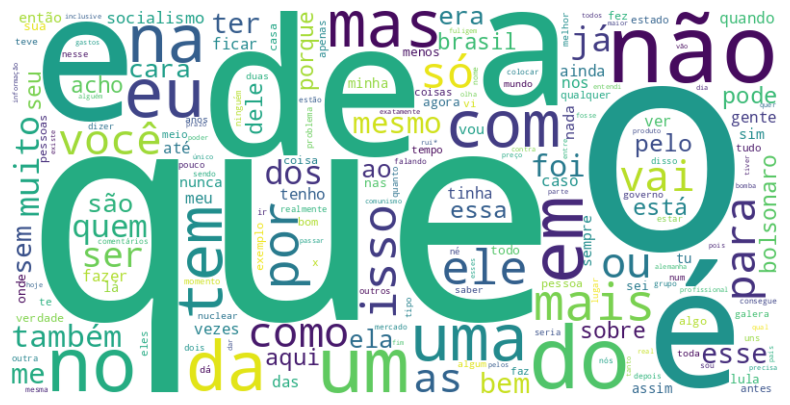

In [35]:
#neutros
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(dict(count_words_neu))

# Exibir a nuvem de palavras
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()



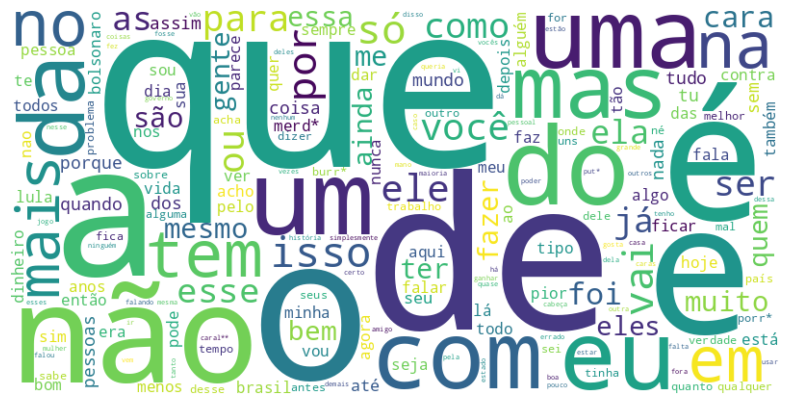

In [36]:
#negativos
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(dict(count_words_neg))

# Exibir a nuvem de palavras
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

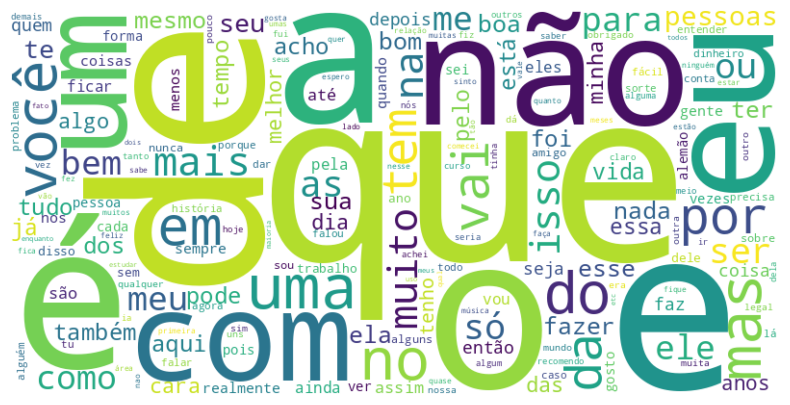

In [37]:
#positivos
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(dict(count_words_pos))

# Exibir a nuvem de palavras
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

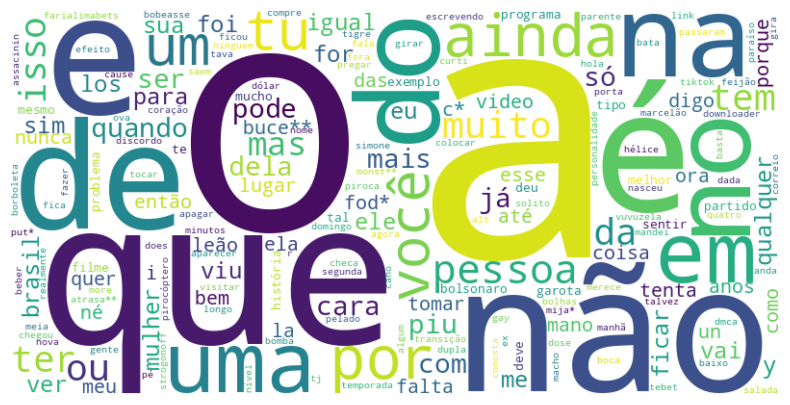

In [38]:
#não sei dizer
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(dict(count_words_ns))

# Exibir a nuvem de palavras
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()




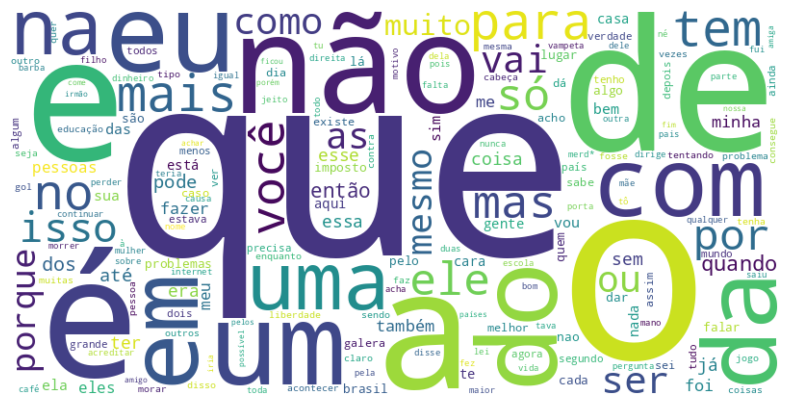

In [39]:
#discordância total
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(dict(count_words_dis))

# Exibir a nuvem de palavras
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

#Nuvem de palavras com para Substantivos, Verbos e Adjetivos

In [40]:
def ocultar_2(x):
  palavra = x.lower()
  if len(palavra) < 6 and x in lista_palavroes:
    return x[:-1] + "*"
  elif palavra in lista_palavroes:
    return x[:-2] + "**"
  else:
    return x

In [41]:
def analyze_pos_distribution(text_corpus):
    # Process the text corpus with the Portuguese language model
    #pipe seria a aplicação do npl em uma lista de texto de uma só vez

    counter_noun = Counter()
    counter_verb = Counter()
    counter_adj = Counter()
    counter_propn = Counter()

    docs = list(nlp.pipe(text_corpus))
    lista_pontuacao = ['!','.', ',', ':', '>', '<', "'", '"', "%", "$", "@", "*", "?", "/", "+", "-", "(", ")", "()", "|", ";", "{}", "^", "~", "´", "`", "{", "}", "[", "]", "[]", "#", "&"]
    lista_consoantes = ['b', 'c', 'd', 'f', 'g', 'h', 'j', 'k', 'l', 'm', 'n', 'p', 'q', 'r', 's', 't', 'v', 'w', 'x', 'y', 'z']
    lista_vogais = ['a', 'e', 'i', 'o', 'u']
    # Count the occurrences of each POS tag in the corpus
    for doc in docs:
        for token in doc:
            if token.text in lista_pontuacao or len(token.text) == 1:
                continue
            if len(token.text) == 2:
              if (token.text[0] in lista_consoantes
                  and token.text[1] in lista_consoantes) or (token.text[0] in lista_vogais
                                                             and token.text[1] in lista_consoantes
                                                             and token.text[0] != 'm'):
                  continue

            if token.pos_ == "NOUN":
              counter_noun[token.text] += 1
            elif token.pos_ == "VERB":
              counter_verb[token.text] += 1
            elif token.pos_ == "ADJ":
              counter_adj[token.text] += 1
            elif token.pos_ == "PROPN":
              if len(token.text.lower()) < 3:
                if token.text[0] in lista_consoantes:
                  continue
              counter_propn[token.text] += 1



    return counter_noun, counter_verb, counter_adj, counter_propn

##Neutro

In [42]:
count_noun_neu, count_verb_neu, count_adj_neu, count_propn_neu = analyze_pos_distribution(neutro_comments['cleaned_comment_v2'].tolist())

In [43]:
count_noun_neu = Counter({ocultar_2(k): v for k, v in count_noun_neu.items()})
count_verb_neu = Counter({ocultar_2(k): v for k, v in count_verb_neu.items()})
count_adj_neu = Counter({ocultar_2(k): v for k, v in count_adj_neu.items()})
count_propn_neu = Counter({ocultar_2(k): v for k, v in count_propn_neu.items()})

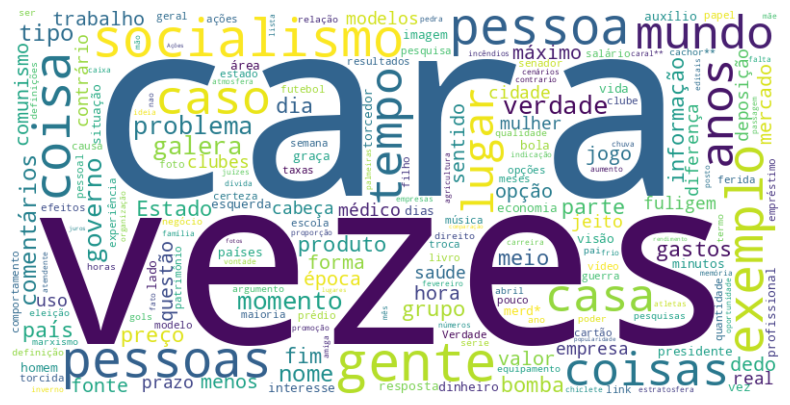

In [44]:
#substantivos comuns
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(dict(count_noun_neu))

# Exibir a nuvem de palavras
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')

plt.show()

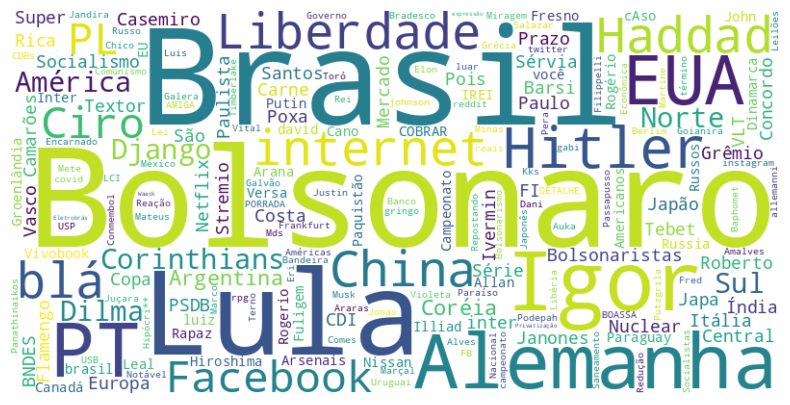

In [45]:
#substantivos próprios

wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(dict(count_propn_neu))

# Exibir a nuvem de palavras
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

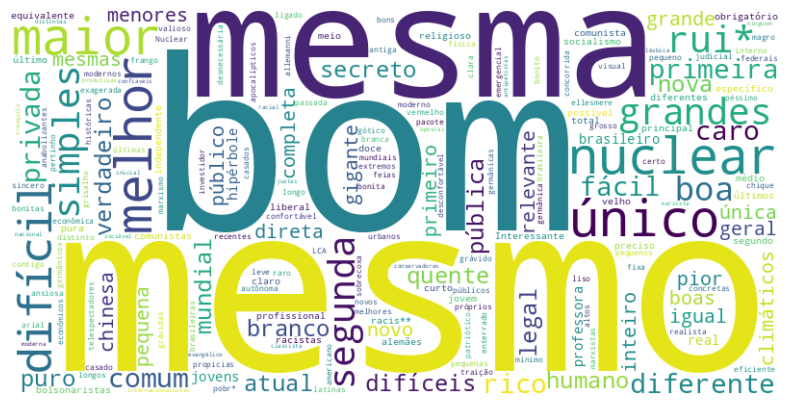

In [46]:
#adjetivos

wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(dict(count_adj_neu))

# Exibir a nuvem de palavras
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

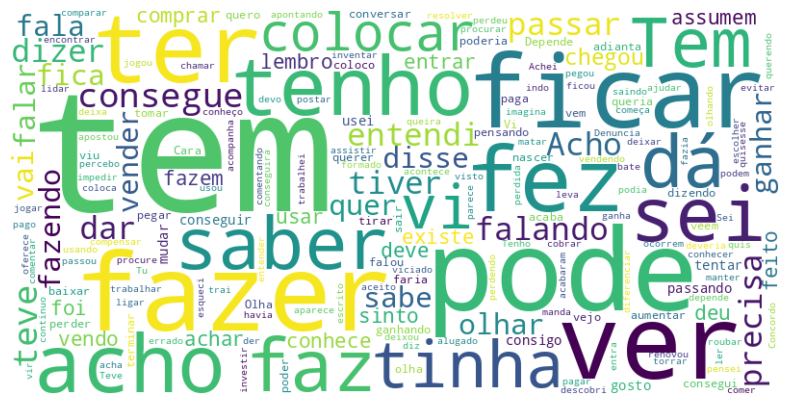

In [47]:
#verb

wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(dict(count_verb_neu))

# Exibir a nuvem de palavras
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

##Negativo

In [48]:
count_noun_neg, count_verb_neg, count_adj_neg, count_propn_neg = analyze_pos_distribution(negativo_comments['cleaned_comment_v2'].tolist())

In [49]:
count_noun_neg = Counter({ocultar_2(k): v for k, v in count_noun_neg.items()})
count_verb_neg = Counter({ocultar_2(k): v for k, v in count_verb_neg.items()})
count_adj_neg = Counter({ocultar_2(k): v for k, v in count_adj_neg.items()})
count_propn_neg = Counter({ocultar_2(k): v for k, v in count_propn_neg.items()})

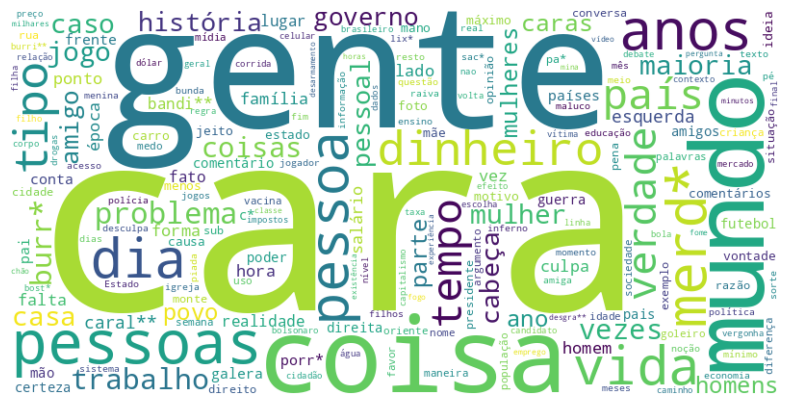

In [50]:
#substantivos comuns
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(dict(count_noun_neg))

# Exibir a nuvem de palavras
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')

plt.show()

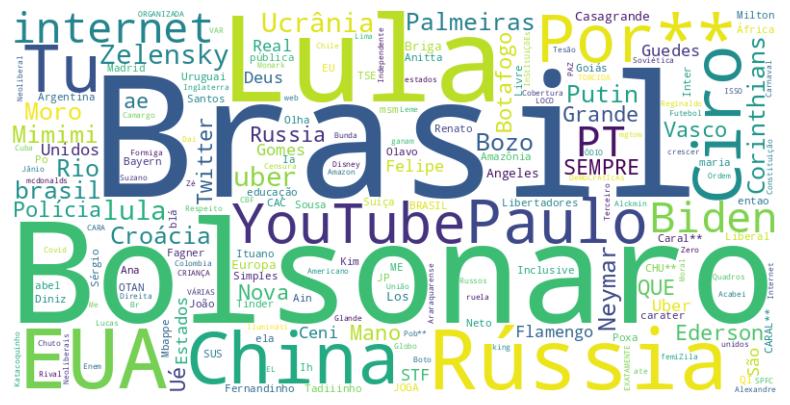

In [51]:
#substantivos próprios

wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(dict(count_propn_neg))

# Exibir a nuvem de palavras
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

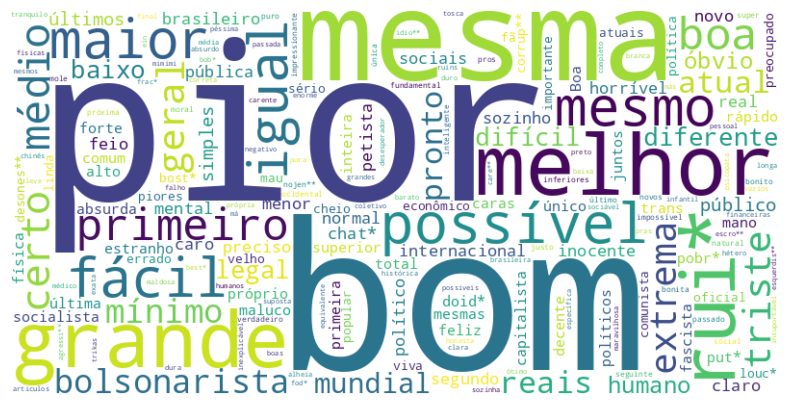

In [52]:
#adjetivos

wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(dict(count_adj_neg))

# Exibir a nuvem de palavras
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

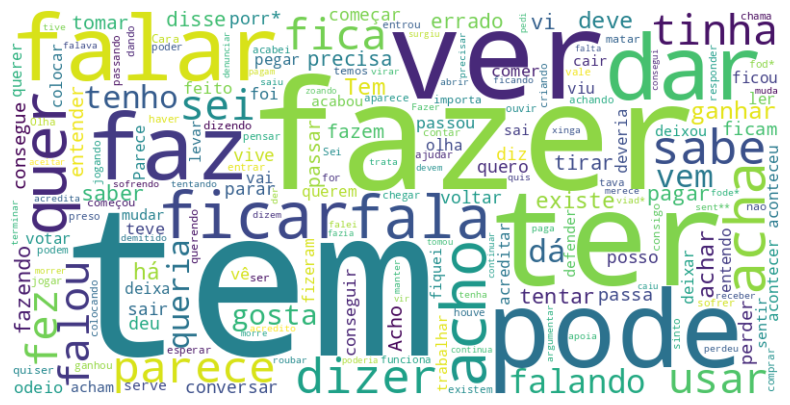

In [53]:
#verb

wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(dict(count_verb_neg))

# Exibir a nuvem de palavras
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

##Positivo

In [54]:
count_noun_p, count_verb_p, count_adj_p, count_propn_p = analyze_pos_distribution(positivo_comments['cleaned_comment_v2'].tolist())

In [55]:
count_noun_p = Counter({ocultar_2(k): v for k, v in count_noun_p.items()})
count_verb_p = Counter({ocultar_2(k): v for k, v in count_verb_p.items()})
count_adj_p = Counter({ocultar_2(k): v for k, v in count_adj_p.items()})
count_propn_p = Counter({ocultar_2(k): v for k, v in count_propn_p.items()})

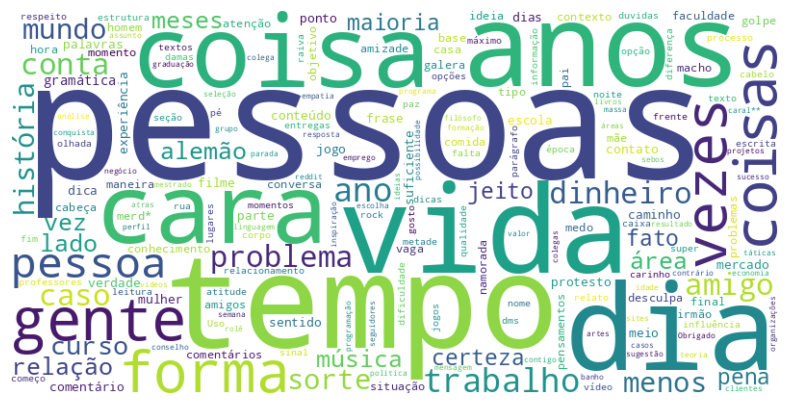

In [56]:
#substantivos comuns
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(dict(count_noun_p))

# Exibir a nuvem de palavras
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')

plt.show()

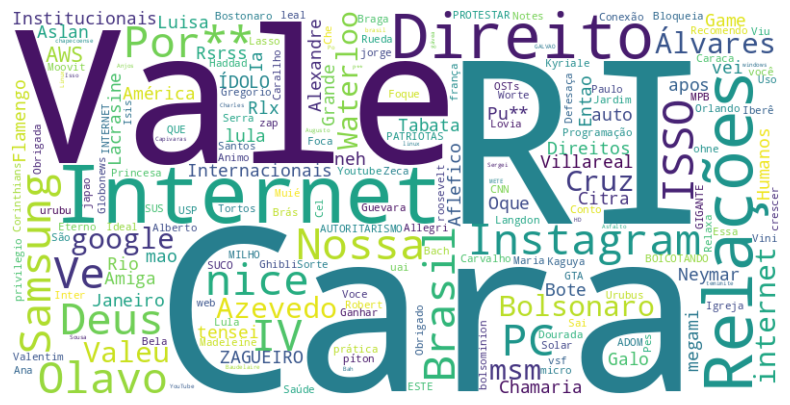

In [57]:
#substantivos próprios

wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(dict(count_propn_p))

# Exibir a nuvem de palavras
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

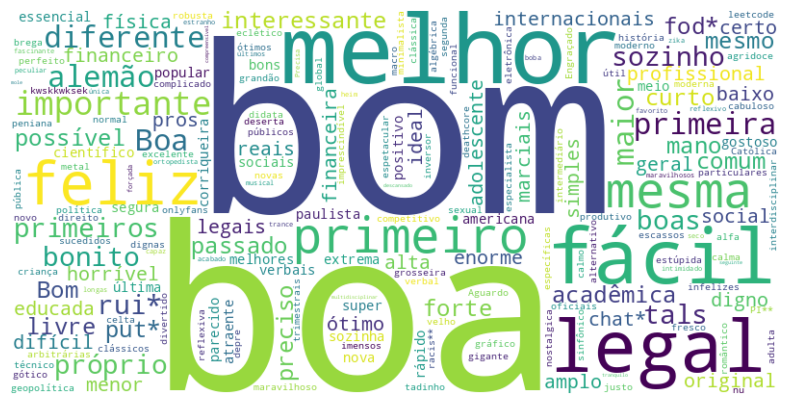

In [58]:
#adjetivos

wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(dict(count_adj_p))

# Exibir a nuvem de palavras
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

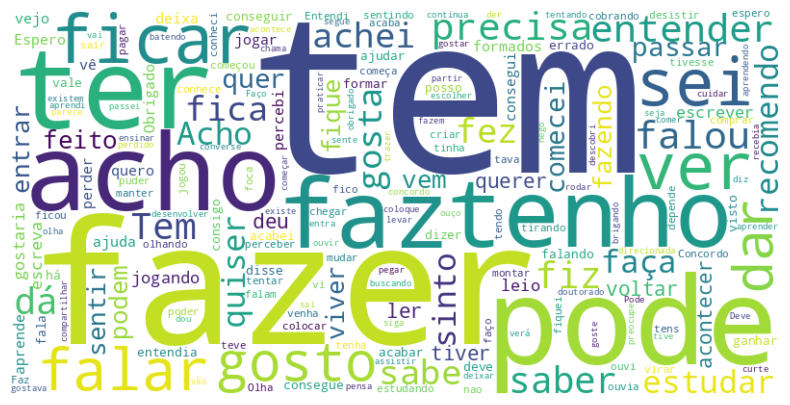

In [59]:
#verb

wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(dict(count_verb_p))

# Exibir a nuvem de palavras
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

##Não sei dizer

In [60]:
count_noun_ns, count_verb_ns, count_adj_ns, count_propn_ns = analyze_pos_distribution(ns_comments['cleaned_comment_v2'].tolist())

In [61]:
count_noun_ns = Counter({ocultar_2(k): v for k, v in count_noun_ns.items()})
count_verb_ns = Counter({ocultar_2(k): v for k, v in count_verb_ns.items()})
count_adj_ns = Counter({ocultar_2(k): v for k, v in count_adj_ns.items()})
count_propn_ns = Counter({ocultar_2(k): v for k, v in count_propn_ns.items()})

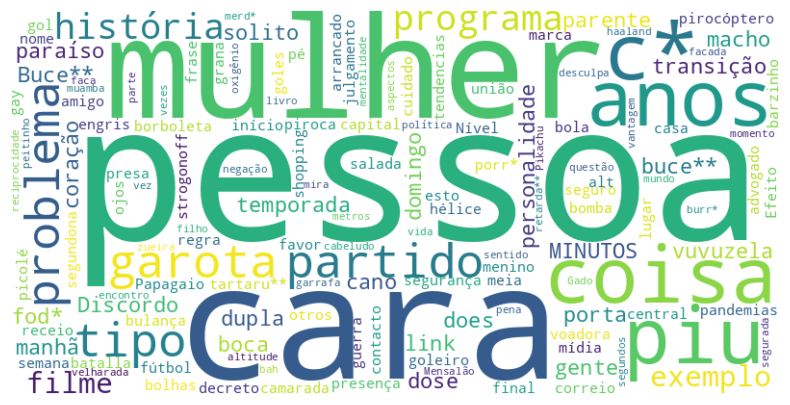

In [62]:
#substantivos comuns
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(dict(count_noun_ns))

# Exibir a nuvem de palavras
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')

plt.show()

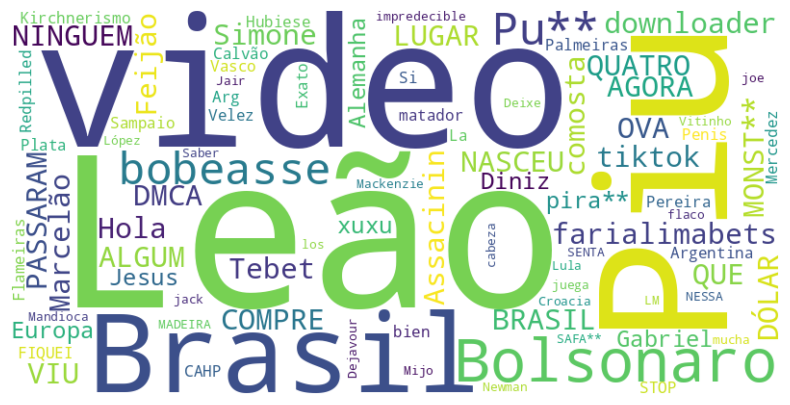

In [63]:
#substantivos próprios

wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(dict(count_propn_ns))

# Exibir a nuvem de palavras
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

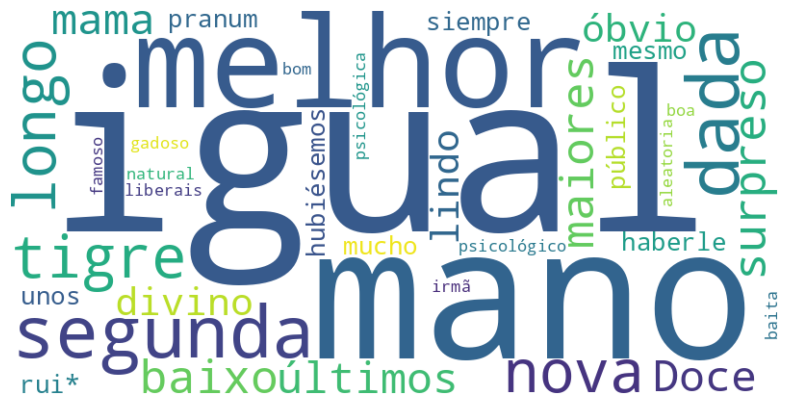

In [64]:
#adjetivos

wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(dict(count_adj_ns))

# Exibir a nuvem de palavras
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

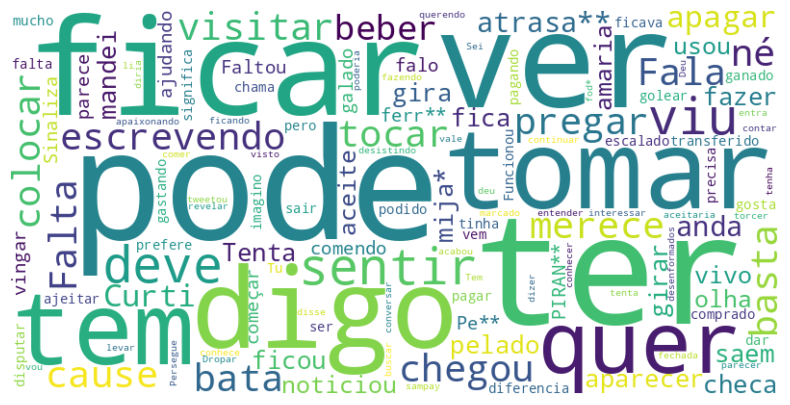

In [65]:
#verb

wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(dict(count_verb_ns))

# Exibir a nuvem de palavras
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

##Discordância Total

In [66]:
count_noun_dis, count_verb_dis, count_adj_dis, count_propn_dis = analyze_pos_distribution(dis_comments['cleaned_comment_v2'].tolist())

In [67]:
count_noun_dis = Counter({ocultar_2(k): v for k, v in count_noun_dis.items()})
count_verb_dis = Counter({ocultar_2(k): v for k, v in count_verb_dis.items()})
count_adj_dis = Counter({ocultar_2(k): v for k, v in count_adj_dis.items()})
count_propn_dis = Counter({ocultar_2(k): v for k, v in count_propn_dis.items()})

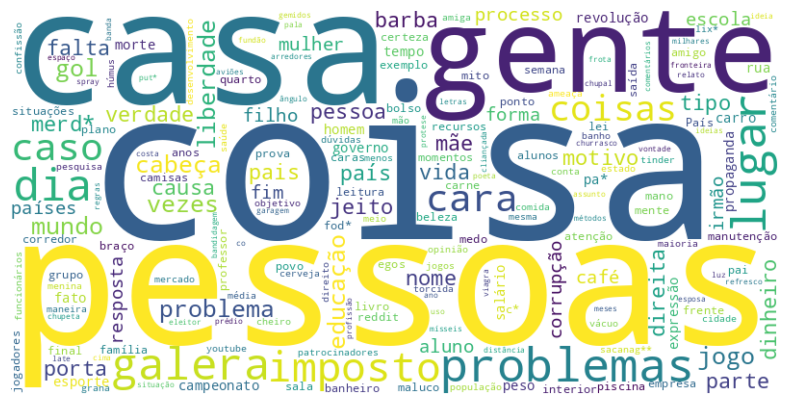

In [68]:
#substantivos comuns
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(dict(count_noun_dis))

# Exibir a nuvem de palavras
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')

plt.show()

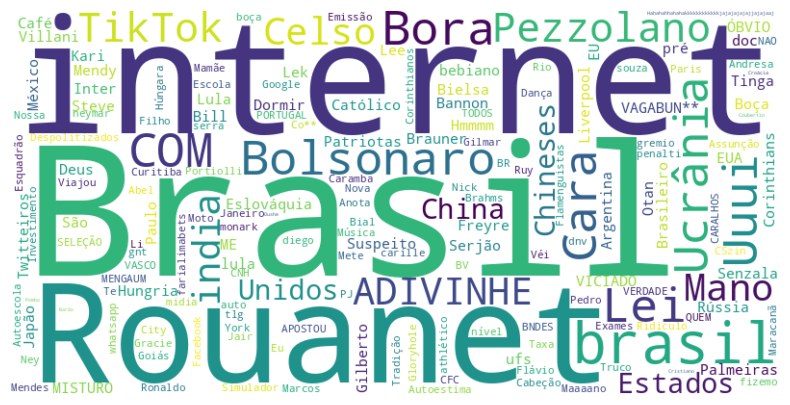

In [69]:
#substantivos próprios

wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(dict(count_propn_dis))

# Exibir a nuvem de palavras
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

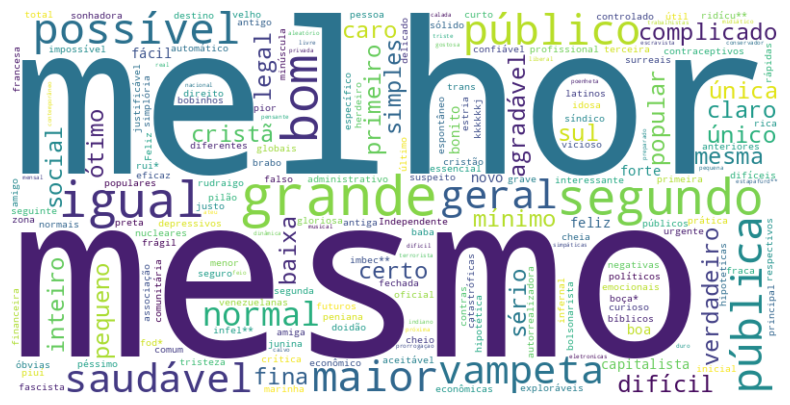

In [70]:
#adjetivos

wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(dict(count_adj_dis))

# Exibir a nuvem de palavras
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

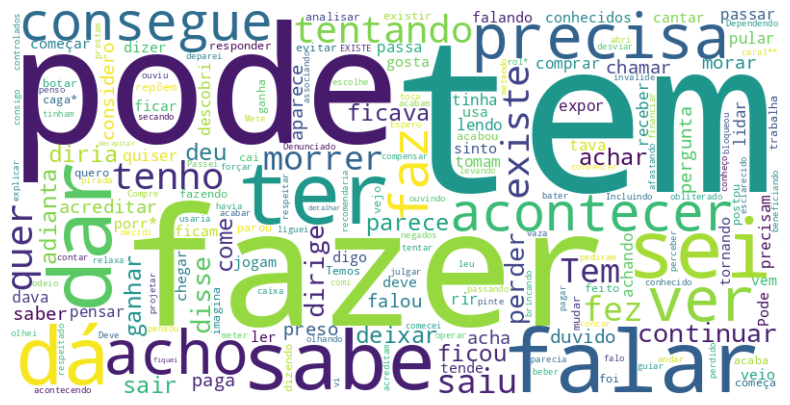

In [71]:
#verb

wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(dict(count_verb_dis))

# Exibir a nuvem de palavras
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

#Nuvem de palavras com para Substantivos, Verbos e Adjetivos

In [72]:
count_noun_neu, count_verb_neu, count_adj_neu, count_propn_neu = analyze_pos_distribution(neutro_comments['cleaned_comment_v2'].tolist())
count_noun_neg, count_verb_neg, count_adj_neg, count_propn_neg = analyze_pos_distribution(negativo_comments['cleaned_comment_v2'].tolist())
count_noun_p, count_verb_p, count_adj_p, count_propn_p = analyze_pos_distribution(positivo_comments['cleaned_comment_v2'].tolist())
count_noun_ns, count_verb_ns, count_adj_ns, count_propn_ns = analyze_pos_distribution(ns_comments['cleaned_comment_v2'].tolist())

In [73]:
#neutro
exclusivos_noun_neu = count_noun_neu.keys() - count_noun_neg.keys() - count_noun_p.keys() - count_noun_ns.keys() - count_noun_dis.keys()
exclusivos_verb_neu = count_verb_neu.keys() - count_verb_neg.keys() - count_verb_p.keys() - count_verb_ns.keys() - count_verb_dis.keys()
exclusivos_adj_neu = count_adj_neu.keys() - count_adj_neg.keys() - count_adj_p.keys() - count_adj_ns.keys() - count_adj_dis.keys()
exclusivos_propn_neu = count_propn_neu.keys() - count_propn_neg.keys() - count_propn_p.keys() - count_propn_ns.keys() - count_propn_dis.keys()

exclusivos_noun_neu = Counter({key: count_noun_neu[key] for key in exclusivos_noun_neu})
exclusivos_verb_neu = Counter({key: count_verb_neu[key] for key in exclusivos_verb_neu})
exclusivos_adj_neu = Counter({key: count_adj_neu[key] for key in exclusivos_adj_neu})
exclusivos_propn_neu = Counter({key: count_propn_neu[key] for key in exclusivos_propn_neu})

#negativo
exclusivos_noun_neg = count_noun_neg.keys() - count_noun_neu.keys() - count_noun_p.keys() - count_noun_ns.keys() - count_noun_dis.keys()
exclusivos_verb_neg = count_verb_neg.keys() - count_verb_neu.keys() - count_verb_p.keys() - count_verb_ns.keys() - count_verb_dis.keys()
exclusivos_adj_neg = count_adj_neg.keys() - count_adj_neu.keys() - count_adj_p.keys() - count_adj_ns.keys() - count_adj_dis.keys()
exclusivos_propn_neg = count_propn_neg.keys() - count_propn_neu.keys() - count_propn_p.keys() - count_propn_ns.keys() - count_propn_dis.keys()

exclusivos_noun_neg = Counter({key: count_noun_neg[key] for key in exclusivos_noun_neg})
exclusivos_verb_neg = Counter({key: count_verb_neg[key] for key in exclusivos_verb_neg})
exclusivos_adj_neg = Counter({key: count_adj_neg[key] for key in exclusivos_adj_neg})
exclusivos_propn_neg = Counter({key: count_propn_neg[key] for key in exclusivos_propn_neg})

#positivo
exclusivos_noun_p = count_noun_p.keys() - count_noun_neu.keys() - count_noun_neg.keys() - count_noun_ns.keys() - count_noun_dis.keys()
exclusivos_verb_p = count_verb_p.keys() - count_verb_neu.keys() - count_verb_neg.keys() - count_verb_ns.keys() - count_verb_dis.keys()
exclusivos_adj_p = count_adj_p.keys() - count_adj_neu.keys() - count_adj_neg.keys() - count_adj_ns.keys() - count_adj_dis.keys()
exclusivos_propn_p = count_propn_p.keys() - count_propn_neu.keys() - count_propn_neg.keys() - count_propn_ns.keys() - count_propn_dis.keys()

exclusivos_noun_p = Counter({key: count_noun_p[key] for key in exclusivos_noun_p})
exclusivos_verb_p = Counter({key: count_verb_p[key] for key in exclusivos_verb_p})
exclusivos_adj_p = Counter({key: count_adj_p[key] for key in exclusivos_adj_p})
exclusivos_propn_p = Counter({key: count_propn_p[key] for key in exclusivos_propn_p})
#não sei dizer
exclusivos_noun_ns = count_noun_ns.keys() - count_noun_neu.keys() - count_noun_neg.keys() - count_noun_p.keys() - count_noun_dis.keys()
exclusivos_verb_ns = count_verb_ns.keys() - count_verb_neu.keys() - count_verb_neg.keys() - count_verb_p.keys() - count_verb_dis.keys()
exclusivos_adj_ns = count_adj_ns.keys() - count_adj_neu.keys() - count_adj_neg.keys() - count_adj_p.keys() - count_adj_dis.keys()
exclusivos_propn_ns = count_propn_ns.keys() - count_propn_neu.keys() - count_propn_neg.keys() - count_propn_p.keys() - count_propn_dis.keys()

exclusivos_noun_ns = Counter({key: count_noun_ns[key] for key in exclusivos_noun_ns})
exclusivos_verb_ns = Counter({key: count_verb_ns[key] for key in exclusivos_verb_ns})
exclusivos_adj_ns = Counter({key: count_adj_ns[key] for key in exclusivos_adj_ns})
exclusivos_propn_ns = Counter({key: count_propn_ns[key] for key in exclusivos_propn_ns})

In [74]:
exclusivos_noun_neu = Counter({ocultar_2(k): v for k, v in exclusivos_noun_neu.items()})
exclusivos_verb_neu = Counter({ocultar_2(k): v for k, v in exclusivos_verb_neu.items()})
exclusivos_adj_neu = Counter({ocultar_2(k): v for k, v in exclusivos_adj_neu.items()})
exclusivos_propn_neu = Counter({ocultar_2(k): v for k, v in exclusivos_propn_neu.items()})

exclusivos_noun_neg = Counter({ocultar_2(k): v for k, v in exclusivos_noun_neg.items()})
exclusivos_verb_neg = Counter({ocultar_2(k): v for k, v in exclusivos_verb_neg.items()})
exclusivos_adj_neg = Counter({ocultar_2(k): v for k, v in exclusivos_adj_neg.items()})
exclusivos_propn_neg = Counter({ocultar_2(k): v for k, v in exclusivos_propn_neg.items()})

exclusivos_noun_p = Counter({ocultar_2(k): v for k, v in exclusivos_noun_p.items()})
exclusivos_verb_p = Counter({ocultar_2(k): v for k, v in exclusivos_verb_p.items()})
exclusivos_adj_p = Counter({ocultar_2(k): v for k, v in exclusivos_adj_p.items()})
exclusivos_propn_p = Counter({ocultar_2(k): v for k, v in exclusivos_propn_p.items()})

exclusivos_noun_ns = Counter({ocultar_2(k): v for k, v in exclusivos_noun_ns.items()})
exclusivos_verb_ns = Counter({ocultar_2(k): v for k, v in exclusivos_verb_ns.items()})
exclusivos_adj_ns = Counter({ocultar_2(k): v for k, v in exclusivos_adj_ns.items()})
exclusivos_propn_ns = Counter({ocultar_2(k): v for k, v in exclusivos_propn_ns.items()})


##Neutros

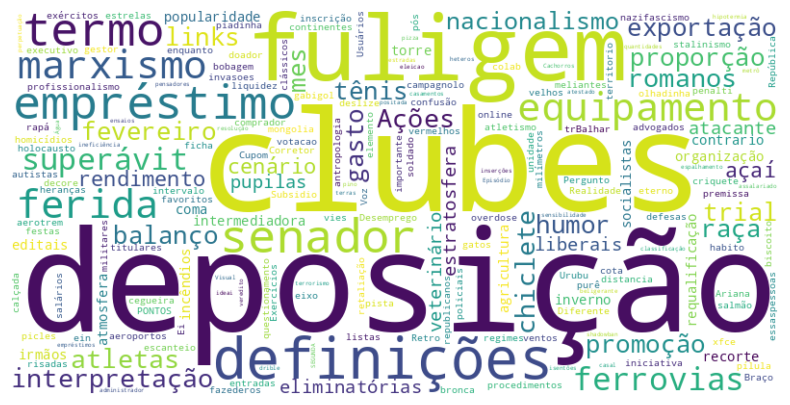

In [75]:
#substantivos comuns
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(dict(exclusivos_noun_neu))

# Exibir a nuvem de palavras
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')

plt.show()

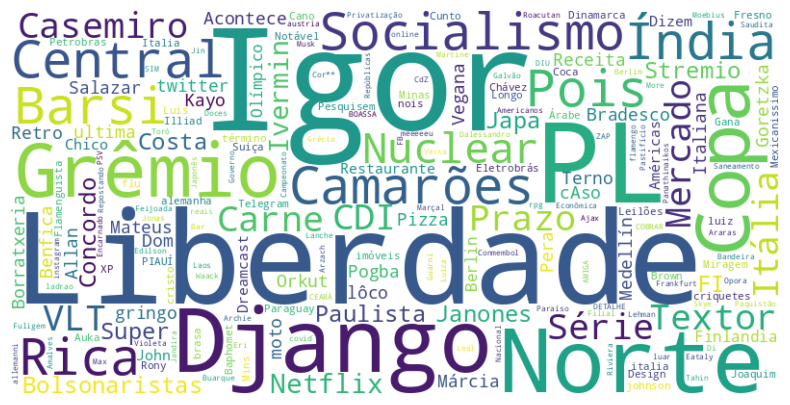

In [76]:
#substantivos próprios
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(dict(exclusivos_propn_neu))

# Exibir a nuvem de palavras
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')

plt.show()

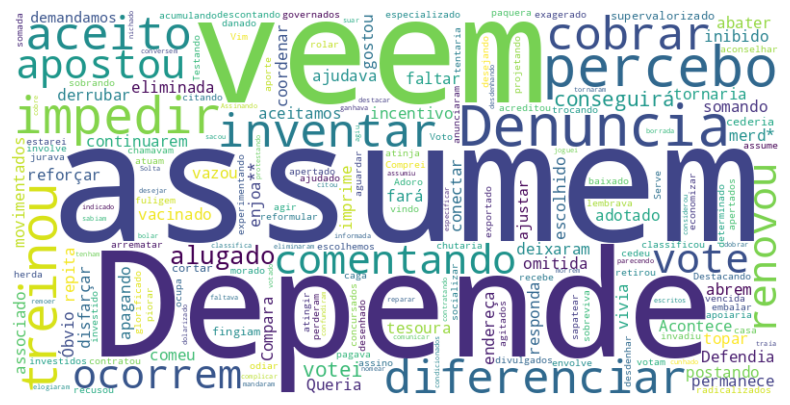

In [77]:
#verbos
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(dict(exclusivos_verb_neu))

# Exibir a nuvem de palavras
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')

plt.show()

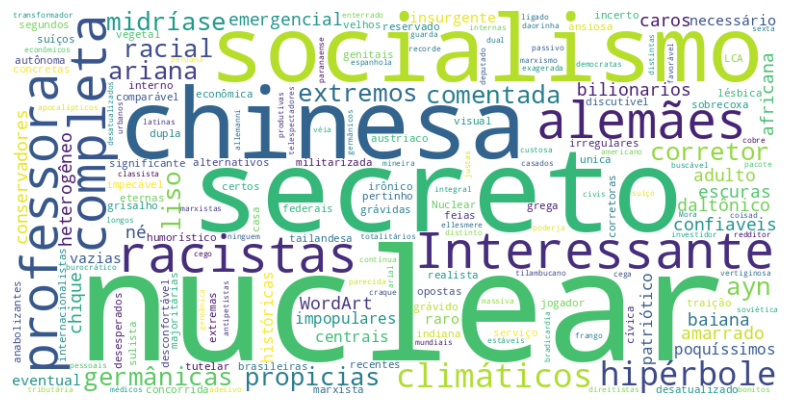

In [78]:
#adjetivos
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(dict(exclusivos_adj_neu))

# Exibir a nuvem de palavras
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')

plt.show()

##Negativos

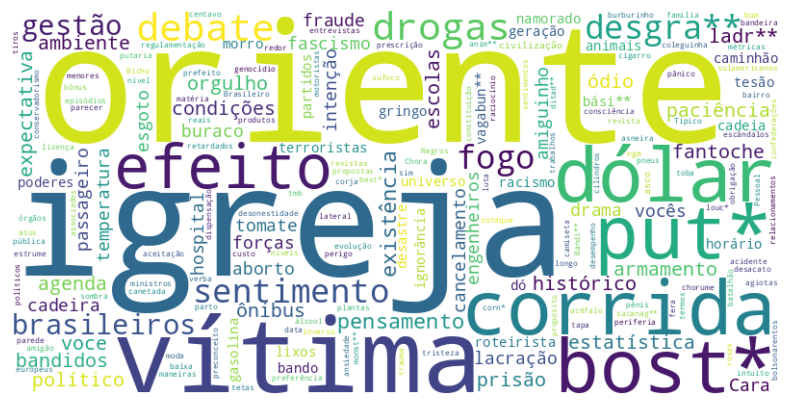

In [79]:
#noun
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(dict(exclusivos_noun_neg))

# Exibir a nuvem de palavras
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')

plt.show()

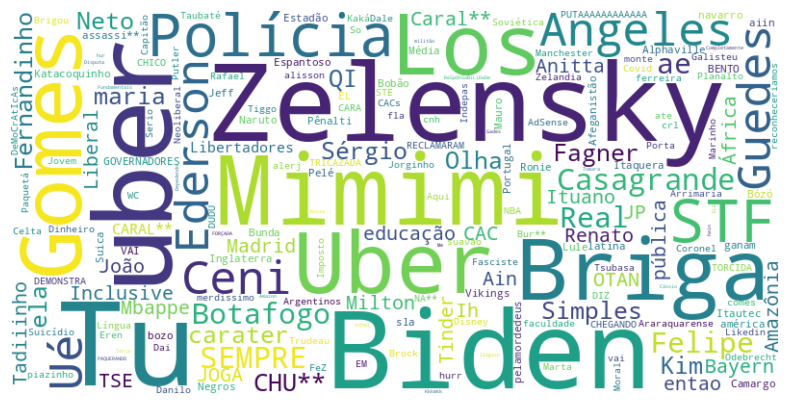

In [80]:
#propn
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(dict(exclusivos_propn_neg))

# Exibir a nuvem de palavras
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')

plt.show()

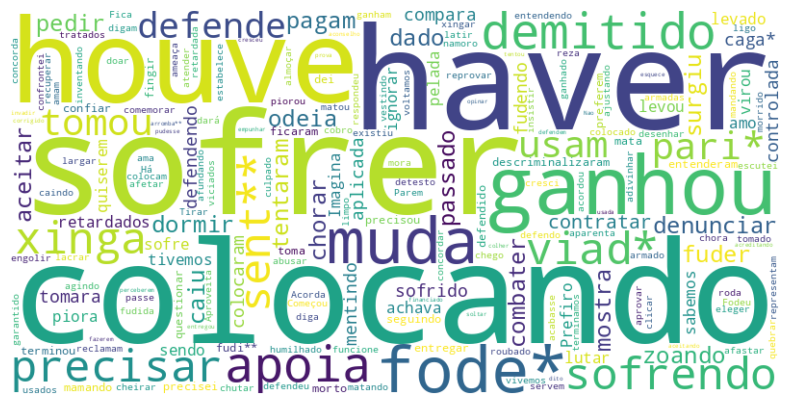

In [81]:
#verb
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(dict(exclusivos_verb_neg))

# Exibir a nuvem de palavras
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')

plt.show()

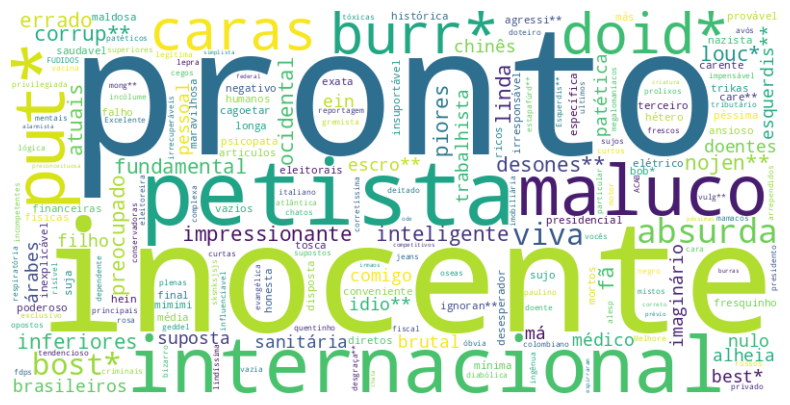

In [82]:
#adjetivos
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(dict(exclusivos_adj_neg))

# Exibir a nuvem de palavras
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')

plt.show()

##Positivo

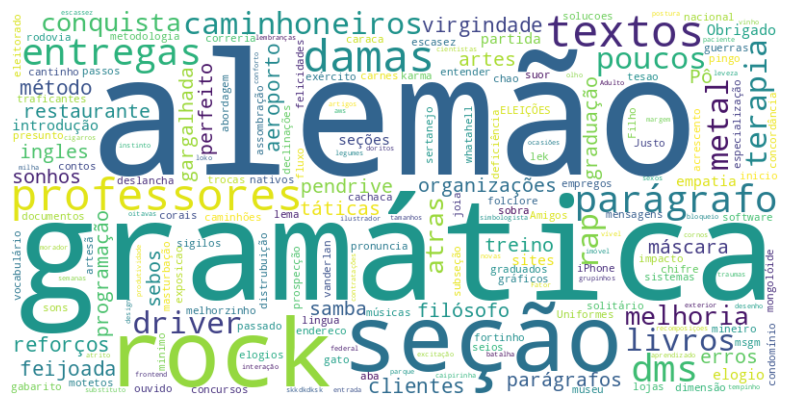

In [83]:
#noun
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(dict(exclusivos_noun_p))

# Exibir a nuvem de palavras
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')

plt.show()

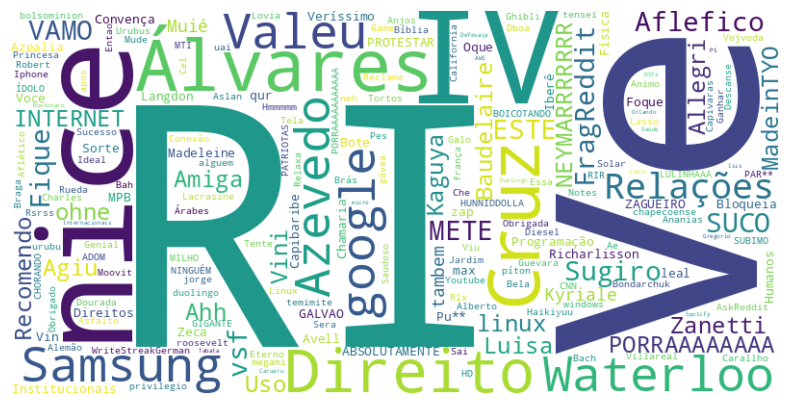

In [84]:
#propn
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(dict(exclusivos_propn_p))

# Exibir a nuvem de palavras
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')

plt.show()

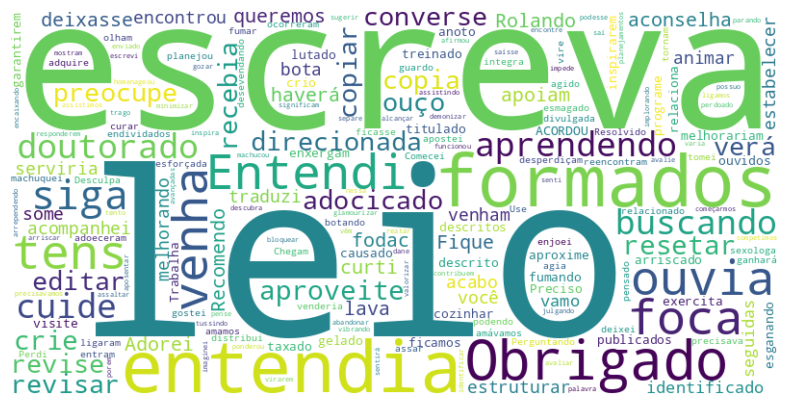

In [85]:
#verb
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(dict(exclusivos_verb_p))

# Exibir a nuvem de palavras
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')

plt.show()

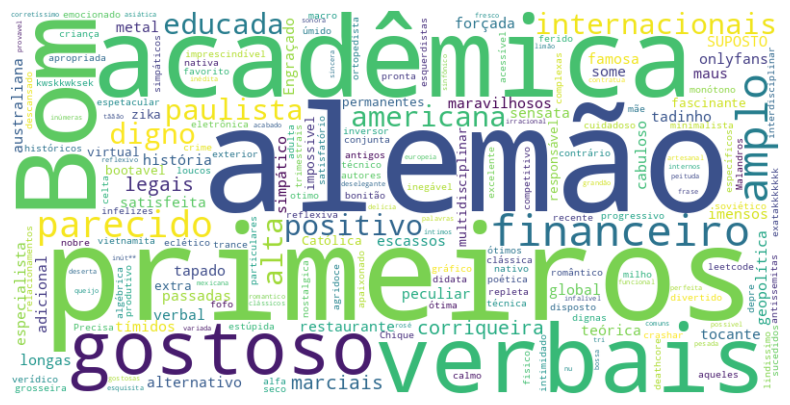

In [86]:
#adjetivos
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(dict(exclusivos_adj_p))

# Exibir a nuvem de palavras
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')

plt.show()

##Não sei dizer

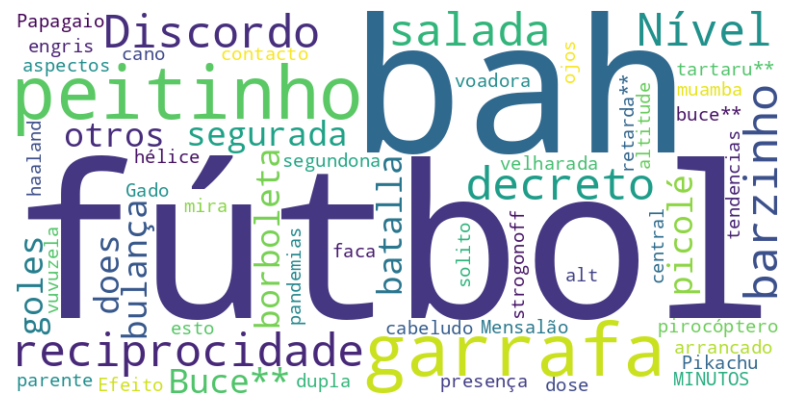

In [87]:
#noun
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(dict(exclusivos_noun_ns))

# Exibir a nuvem de palavras
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')

plt.show()

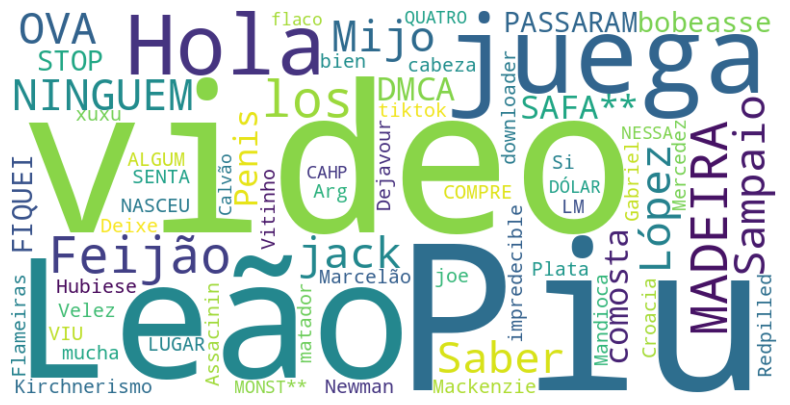

In [88]:
#propn
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(dict(exclusivos_propn_ns))

# Exibir a nuvem de palavras
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')

plt.show()

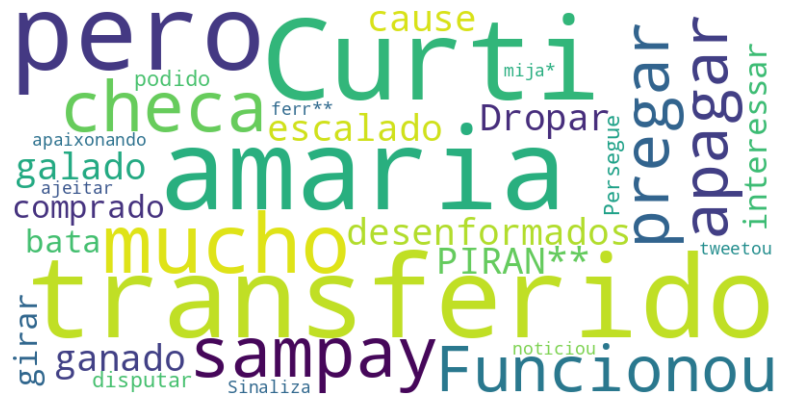

In [89]:
#verb
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(dict(exclusivos_verb_ns))

# Exibir a nuvem de palavras
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')

plt.show()

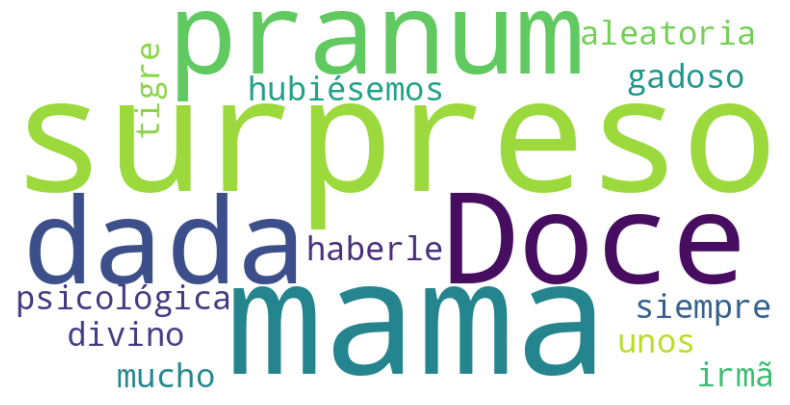

In [90]:
#adjetivos
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(dict(exclusivos_adj_ns))

# Exibir a nuvem de palavras
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')

plt.show()

#Postagens com palavras negativas

In [91]:
!pip install stopwordsiso

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 73.5/73.5 kB 2.0 MB/s eta 0:00:00


In [92]:
import stopwordsiso as stopwords

In [93]:
stop_words_negativas = [
    "não", "nada", "nenhum", "nem", "nunca", "jamais", "impossível", "pior", "péssimo", "horrível",
    "odiar", "detesto", "odeio", "problema", "problemas", "infelizmente", "lamentável", "chato",
    "cansativo", "perda", "falha", "erro", "errado", "desastroso", "absurdo", "insatisfeito",
    "insatisfação", "decepcionante", "decepção", "fraco", "ruim", "péssima", "dificuldade",
    "difícil", "sem", "frustrante", "complicado", "desorganizado", "desleixo",
    "insuficiente", "negativo", "falta", "desagrado", "desagradar", "tristeza", "cansado",
    "incomodado", "inconveniente", "insuportável", "ignorar", "desprezo", "reprovável",
    "vergonhoso", "sujo", "problemático", "dispensável", "irritante", "inadequado", "abandono",
    "medíocre", "negligência", "inútil", "insensível", "desatento", "revoltante", "baixo",
    "desvantagem", "superficial", "insatisfatório", "descaso", "omisso", "péssima",
    "desapontado", "injustiça", "infeliz", "inaceitável", "falhou", "horrorizado",
    "frustrado", "perda", "nada", "ineficaz", "ignorante",
    "impraticável", "mal", "absurdo", "irritado",
    "insuportável",  "desmotivador", "decepcionado", "má", "não",
    "improdutivo", "insuficiente", "contra", "menos", "menor", "nenhuma", "somente", "mal",
    "embora", "porém", "todavia", "entretanto", "apenas", "último", "pouco", "longe", "único",
    "limitado", "restrito", "dificilmente", "escasso", "exclusivo", "inviável", "inalcançável",
    "deficiente", "inadequado", "irrelevante", "anterior", "inferior", "indisponível", "proibido",
    "restrição", "exceto", "unicamente", "falso", "baixo", "não", "nada", "nenhum", "nem", "nunca", "jamais", "impossível",
    "pior", "péssimo", "horrível", "detesto", "odeio", "lamentável",
    "infelizmente", "chato", "insuportável", "ruim", "fraco",
    "complicado", "inadequado", "indesejado", "insuportável",
    "prejudicial", "desagradável", "dificuldade", "difícil", "problema",
    "falha", "erro", "enganado", "fracasso", "cansativo", "desastre",
    "negligente", "baixo", "perda", "injusto",
    "perigoso", "irresponsável", "falso", "tóxico", "desprezível",
    "preconceituoso", "ridículo", "vergonhoso", "inaceitável",
    "falta", "incompleto", "inadequado", "inadmissível", "incorreto",
    "desleixado", "defeituoso", "limitado", "restrito", "superficial",
    "inviável", "desapontado", "excessivo", "ineficaz", "inferior",
    "incapaz", "insuficiente", "decepcionante", "desanimado",
    "preocupante", "desproporcional", "inútil", "problemático",
    "frustrante", "improdutivo", "pouco", "omisso", "ignorante",
    "medíocre", "prepotente", "fora",
     "não",
    "nada",
    "nenhum",
    "nenhuma",
    "ninguém",
    "nem",
    "nunca",
    "jamais",
    "mas",
    "porém",
    "entretanto",
    "todavia",
    "contudo",
    "entanto",
    "embora",
    "apesar",
    "obstante",
    "contrariamente",
    "contrário",
    "diferentemente",
    "pouco",
    "raramente",
    "mal",
    "apenas",
    "não",
    "nada",
    "nenhum",
    "nenhuma",
    "ninguém",
    "nem",
    "nunca",
    "jamais",
    "mas",
    "porém",
    "entretanto",
    "todavia",
    "contudo",
    "contrariamente",
    "diferentemente",
    "pouco",
    "raramente",
    "mal",
    "apenas",
    "nem",
    "contrapartida",
    "tampouco",
    "senão",
    'atrás', 'baixo', 'desligado', 'não', 'nada', 'nem',
    'nenhuma', 'mal', 'menos', 'nunca', 'contra', 'dúvida', 'pouco', 'poucos',
    'dizem', 'errado', 'longe', 'sem', 'tarde', 'duro', 'errada'
]


In [94]:
sw_negativas = [x for x in stopwords.stopwords("pt") if x in stop_words_negativas]
sw_negativas = sw_negativas + ["não",
    "nada",
    "nenhum",
    "nenhuma",
    "ninguém",
    "nem",
    "nunca",
    "jamais",
    "mas",
    "porém",
    "entretanto",
    "todavia",
    "contudo",
    "entanto",
    "embora",
    "apesar",
    "apenas",
    "não",
    "nada",
    "nenhum",
    "nenhuma",
    "ninguém",
    "nem",
    "nunca",
    "jamais",
    "mas",
    "porém",
    "entretanto",
    "todavia",
    "contudo",
    "apenas",
    "nem",
    "tampouco",
    "senão", 'nada', 'nem',
    'nenhuma', 'menos', 'nunca',
     'sem']

In [95]:
lista_frases = []

In [96]:
len(comments_df)

2000

In [97]:
for i, l in comments_df.iterrows():

  lista_palavras = []

  doc = nlp(l['Comentário'])

  for token in doc:
    p = token.text.lower()

    if p in sw_negativas:
      lista_palavras.append(p)
  if len(lista_palavras) > 0:
    lista_frases.append({'id': l['id'], 'palavras': lista_palavras})


In [98]:
dados = pd.DataFrame(lista_frases)
dados

,id,palavras
0,hr39bh3,"[mas, nem, não, mas, não, falta, mas, não]"
1,hr4zdgd,[sem]
2,hrd2klr,"[não, não]"
3,hrflhlt,"[não, não, mas]"
4,hs49oxz,"[não, não]"
...,...,...
952,j0zpra7,[sem]
953,j1ara7e,[sem]
954,j1irv6h,[mas]
955,j21u2z0,"[não, não]"


In [99]:
dados = pd.merge(comments_df, dados, on='id', how='inner')
dados.head(20)

,Unnamed: 0,id,Comentário,class1,class2,class3,class_result,total_agreement,palavras
0,0,hr39bh3,"Olha, vou falar sobre a minha experiência. Fui muito privilegiado de ter uma educação e um ensino superior, tanto que hoje consegui trabalhar na área de formação, mas vou te falar uma coisa todo dia que eu levanto eu tenho vontade de desistir, ir pra alguma coisa que me traga alegria nem tanto dinheiro já que o emprego atual também não paga lá essas coisas. Mas é como você descreveu, eu vou sair de um trabalho com ganho garantido ao final do mês para uma coisa incerta? Não falta vontade mas o medo de não dar certo prende a gente nesse modo de vida.",-1,-1,-1,-1,1,"[mas, nem, não, mas, não, falta, mas, não]"
1,1,hr4zdgd,Intervencionismo externo visando ganho próprio e sem estudar a situação complexa e possiveis consequencias.\nUm clássico dos estados unidos de merda,-1,-1,-1,-1,1,[sem]
2,3,hrd2klr,"Se fosse assim, quem morrer de parada cardíaca e não tomou a vacina, eu poderia dizer que foi pq não tomou?",-1,-1,0,-1,0,"[não, não]"
3,4,hrflhlt,"Em momentos como o atual, tomar medidas de precaução que custam bastante dinheiro é sofrido mesmo.\n\nEu tive que trocar de óculos. Meu grau de miopia é muito alto e fazia tempo que eu não trocava. Gastei 1400 reais depois de barganhar pra caramba e pegar a lente mais barata que tinha na loja.\n\nNão me arrependo, mas doeu na alma",1,-1,-1,-1,0,"[não, não, mas]"
4,7,hs49oxz,Não disse que não ia gostar,1,0,0,0,0,"[não, não]"
5,14,hsncxtq,"A resposta, a meu entender, é que a sociedade não vê casais homo como algo normal.\n\nTem gente que chama isso de homofobia, e acreditam que com o tempo podemos ensinar à população que existem homossexuais e que eles não são pessoas menos dignas por conta da orientação sexual. Sou uma dessas pessoas.",10,1,1,1,0,"[não, não, menos]"
6,16,ht9my53,"Relações Internacionais.\n\nA base do curso é história e política, tem MUITA leitura - clássicos da filosofia, livros imensos de história global, biografias de líderes, documentos oficiais, teoria política, etc etc etc - e muita escrita também. É comum os graduados de RI irem pra área acadêmica justamente por tanta produção acadêmica que é incentivada a ser feita na faculdade E pela deficiência do mercado de trabalho. Pra quem gosta de estudar, é maravilhoso. Você aprende sobre política (de verdade), geopolítica, organizações internacionais, legislação, história, economia (macro e micro)... é realmente um arcabouço gigante. Você aprende a fazer análise de discurso e teorias, prospecção de cenários também, o que é muito legal. \n\nUma memória que guardo com carinho da graduação foi uma aula sobre táticas de guerra em que assistimos alguns vídeos de Game of Thrones e comparamos com umas passagens de um livro de Alexandre, o Grande para fazer uma análise das táticas empregadas nos dois casos. \n\nSobre o mercado de trabalho: é horrível. Por se tratar de um curso extremamente amplo e interdisciplinar, a gente compete com pessoas com formação mais robusta. Se é uma vaga de financeiro, competimos com formados em Economia; se é uma vaga em Direitos Humanos, com formados em Direito; se é uma vaga em Relações Institucionais, com formados em Administração e Direito; e assim vai. Ou seja, é imprescindível fazer uma pós graduação pra se estabelecer como ""profissional"" em uma área. Muita gente vai pro caminho do Mestrado pra essa especialização e pra seguir na carreira acadêmica, buscando também o incentivo das bolsas pra se manter enquanto não entram no mercado de trabalho. \n\nA maioria dos meus colegas estão ou no mestrado/doutorado ou fora da área de atuação. Mesmo os que estão no mestrado/doutorado não tem boas perspectivas por conta dos concursos públicos escassos, e mesmo os cursos particulares de RI contratam professores formados em outras áreas mais específicas (Direito, economia, etc) e poucos professores de RI de fato. \n\nEu sou uma das poucas que está na área, e só consegui por conta de indicação: fiquei 7 meses bus

In [100]:
def converter(x):
  if x == -10:
    return 'discordância total'
  elif x == -1:
    return 'negativo'
  elif x == 0:
     return 'neutro'
  elif x == 1:
     return 'positivo'
  elif x == 10:
     return 'não sei dizer'

In [101]:
dados = dados[['id', 'Comentário', 'class_result','palavras']]
dados['class_result'] = dados['class_result'].apply(lambda x: converter(x))


In [102]:
dados.head(20)

,id,Comentário,class_result,palavras
0,hr39bh3,"Olha, vou falar sobre a minha experiência. Fui muito privilegiado de ter uma educação e um ensino superior, tanto que hoje consegui trabalhar na área de formação, mas vou te falar uma coisa todo dia que eu levanto eu tenho vontade de desistir, ir pra alguma coisa que me traga alegria nem tanto dinheiro já que o emprego atual também não paga lá essas coisas. Mas é como você descreveu, eu vou sair de um trabalho com ganho garantido ao final do mês para uma coisa incerta? Não falta vontade mas o medo de não dar certo prende a gente nesse modo de vida.",negativo,"[mas, nem, não, mas, não, falta, mas, não]"
1,hr4zdgd,Intervencionismo externo visando ganho próprio e sem estudar a situação complexa e possiveis consequencias.\nUm clássico dos estados unidos de merda,negativo,[sem]
2,hrd2klr,"Se fosse assim, quem morrer de parada cardíaca e não tomou a vacina, eu poderia dizer que foi pq não tomou?",negativo,"[não, não]"
3,hrflhlt,"Em momentos como o atual, tomar medidas de precaução que custam bastante dinheiro é sofrido mesmo.\n\nEu tive que trocar de óculos. Meu grau de miopia é muito alto e fazia tempo que eu não trocava. Gastei 1400 reais depois de barganhar pra caramba e pegar a lente mais barata que tinha na loja.\n\nNão me arrependo, mas doeu na alma",negativo,"[não, não, mas]"
4,hs49oxz,Não disse que não ia gostar,neutro,"[não, não]"
5,hsncxtq,"A resposta, a meu entender, é que a sociedade não vê casais homo como algo normal.\n\nTem gente que chama isso de homofobia, e acreditam que com o tempo podemos ensinar à população que existem homossexuais e que eles não são pessoas menos dignas por conta da orientação sexual. Sou uma dessas pessoas.",positivo,"[não, não, menos]"
6,ht9my53,"Relações Internacionais.\n\nA base do curso é história e política, tem MUITA leitura - clássicos da filosofia, livros imensos de história global, biografias de líderes, documentos oficiais, teoria política, etc etc etc - e muita escrita também. É comum os graduados de RI irem pra área acadêmica justamente por tanta produção acadêmica que é incentivada a ser feita na faculdade E pela deficiência do mercado de trabalho. Pra quem gosta de estudar, é maravilhoso. Você aprende sobre política (de verdade), geopolítica, organizações internacionais, legislação, história, economia (macro e micro)... é realmente um arcabouço gigante. Você aprende a fazer análise de discurso e teorias, prospecção de cenários também, o que é muito legal. \n\nUma memória que guardo com carinho da graduação foi uma aula sobre táticas de guerra em que assistimos alguns vídeos de Game of Thrones e comparamos com umas passagens de um livro de Alexandre, o Grande para fazer uma análise das táticas empregadas nos dois casos. \n\nSobre o mercado de trabalho: é horrível. Por se tratar de um curso extremamente amplo e interdisciplinar, a gente compete com pessoas com formação mais robusta. Se é uma vaga de financeiro, competimos com formados em Economia; se é uma vaga em Direitos Humanos, com formados em Direito; se é uma vaga em Relações Institucionais, com formados em Administração e Direito; e assim vai. Ou seja, é imprescindível fazer uma pós graduação pra se estabelecer como ""profissional"" em uma área. Muita gente vai pro caminho do Mestrado pra essa especialização e pra seguir na carreira acadêmica, buscando também o incentivo das bolsas pra se manter enquanto não entram no mercado de trabalho. \n\nA maioria dos meus colegas estão ou no mestrado/doutorado ou fora da área de atuação. Mesmo os que estão no mestrado/doutorado não tem boas perspectivas por conta dos concursos públicos escassos, e mesmo os cursos particulares de RI contratam professores formados em outras áreas mais específicas (Direito, economia, etc) e poucos professores de RI de fato. \n\nEu sou uma das poucas que está na área, e só consegui por conta de indicação: fiquei 7 meses buscando emprego na área (morando no Rio de Janeiro) e não consegui só na abordagem dos cu

In [103]:
dados.to_csv('/content/drive/MyDrive/Colab Notebooks/IC/Russia/comentarios_stopwords_negativas.csv')

In [104]:
neg_df = dados[dados['class_result'] == -1]
neu_df = dados[dados['class_result'] == 0]
pos_df = dados[dados['class_result'] == 1]
ns_df = dados[dados['class_result'] == 10]

neg_df = neg_df.assign(cleaned_comment_v2=neg_df['Comentário'].apply(lambda c: clean_comment_v2(str(c))))
neu_df = neu_df.assign(cleaned_comment_v2=neu_df['Comentário'].apply(lambda c: clean_comment_v2(str(c))))
pos_df = pos_df.assign(cleaned_comment_v2=pos_df['Comentário'].apply(lambda c: clean_comment_v2(str(c))))
ns_df = ns_df.assign(cleaned_comment_v2=ns_df['Comentário'].apply(lambda c: clean_comment_v2(str(c))))


In [105]:
def contar_negativas(df):

  contagem_stop_neg = Counter()

  for i, l in df.iterrows():

    for p in l['palavras']:
      contagem_stop_neg[p] += 1
  return contagem_stop_neg

In [106]:
textos_neu = [nltk.word_tokenize(str(x).lower()) for x in  neu_df.loc[:, 'cleaned_comment_v2'].tolist()]
textos_neg = [nltk.word_tokenize(str(x).lower()) for x in  neg_df.loc[:, 'cleaned_comment_v2'].tolist()]
textos_pos = [nltk.word_tokenize(str(x).lower()) for x in  pos_df.loc[:, 'cleaned_comment_v2'].tolist()]
textos_ns = [nltk.word_tokenize(str(x).lower()) for x in  ns_df.loc[:, 'cleaned_comment_v2'].tolist()]

In [107]:
def concatenar_listas(grupo_listas):
  lista_final = []

  for l in grupo_listas:
    lista_final = lista_final + l

  return lista_final

In [108]:
def ocultar(x):
  if len(x) < 6:
    return x[:-1] + "*"
  else:
    return x[:-2] + "**"

In [109]:
palavras_neu = concatenar_listas(textos_neu)
palavras_neg = concatenar_listas(textos_neg)
palavras_pos = concatenar_listas(textos_pos)
palavras_ns = concatenar_listas(textos_ns)

palavras_neu = [ocultar(x) if x in lista_palavroes else x for x in palavras_neu]
palavras_neg = [ocultar(x) if x in lista_palavroes else x for x in palavras_neg]
palavras_pos = [ocultar(x) if x in lista_palavroes else x for x in palavras_pos]
palavras_ns = [ocultar(x) if x in lista_palavroes else x for x in palavras_ns]

In [110]:
def contar_palavras(texto):

  count_words = Counter()

  for palavra in texto:
    count_words[palavra] += 1

  return count_words

In [111]:
count_words_neu = contar_palavras(palavras_neu)
count_words_neg = contar_palavras(palavras_neg)
count_words_pos = contar_palavras(palavras_pos)
count_words_ns = contar_palavras(palavras_ns)

In [112]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from collections import Counter

In [ ]:
#neutros
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(dict(count_words_neu))

# Exibir a nuvem de palavras
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

In [ ]:
#neutros
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(dict(contar_negativas(neu_df)))

# Exibir a nuvem de palavras
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()